Project of Brain Modeling

Barbieri Chiara - 517096

Sotgia Francesca - 513067

# **Surgical resection to cure epilepsy**

The aim of the project is to recreate an epilepsy patient's brain through The Virtual Brain to check if the surgical resection of specific brain regions can be beneficial.


### Epilepsy
Epilepsy is a chronic neurological disease that affects around 50 million people worldwide. It is characterized by recurrent seizures, which are brief episodes of involuntary movement that may involve a part of the body or the entire body.

Seizures are a result of excessive electrical discharges in a group of brain cells, which can be located in different parts of the brain. They can vary in frequency, based on the severity of the condition.

### Epileptogenic zone
Epileptogenic Zone (EZ) is a specific area of the brain responsible for the generation of seizures.

The surgical resection of the Epileptogenic Zone may lead to the cease of seizures.

### The Virtual Brain
The Virtual Brain is an open-source computational platform for modeling and simulating personalized brain models, allowing the design of brain activity and connectivity.

TVB processes large amount of data to obtain results to be potentially used for personalized treatments and diagnostic decision-making.

TVB is a powerful tool in our framework beacuse it enables us to model a patient's brain to understand the effects of surgical resection.

## Import libraries

In [ ]:
!pip install tvb-library

In [ ]:
!pip install tvb-framework

In [ ]:
%pylab nbagg
from tvb.simulator.lab import *
from tvb.simulator.lab import monitors
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


# Create Epileptor model

To run a simulation of the brain we need five components:
- Model
- Connectivity
- Coupling
- Integrator
- Monitors



## Defining the Epileptor model

The model is a set of differential equations describing the local neuronal dynamics.

The Epileptor is a phenomenological neural mass model able to reproduce epileptic seizure dynamics such as those recorded with intracranial EEG electrodes.

**Parameters:**
- **x0**: controls seizure threshold (dimensionless), epileptogenicity
- **tau**: time scale separation (ms)
- **Iext**: external input current (µA)
- **Kf**: coupling scaling on a fast time scale
- **Ks**: permettivity coupling, from the fast time scale to the slow time scale
- **r**: temporal scaling in the third state variable

In [ ]:
# Create an Epileptor model instance
epileptor = models.Epileptor(
    x0=np.array([-1.6]),      # default
    tau = np.array([10]),     # default
    Iext = np.array([3.1]),   # default
    Ks=np.array([-0.2]),
    Kf=np.array([0.1]),
    r=np.array([0.00015])
)

### Model a patient with temporal lobe epilepsy (TLE)

Assign different values of epileptogenicity x0 (i.e. tendency to develop tissue that can cause epileptic seizures) according to the region positions.

The right limbic area (that is in the medial temporal lobe) is a group of brain structures involved in processing emotions, memory and motivation. In this area there are the epileptogenic regions, which are:
- Hippocampus (rHC – 9): this region plays an important role in the formation of memories.
- Parahippocampal (rPHC – 24): the zone is relevant for memory encoding and retrieval.
- Amygdala (rAMYG – 2): the area is crucial for the processing of emotions and attaches emotional significance to memories.

On the other hand, the lesser epileptogenic regions defined are:
- Superior temporal cortex (rTCI – 31): the region is involved in the processing of speech and in the integration of auditory information.
- Ventral temporal cortex (rTCV – 34): the area plays an important role in visual object recognition and visual categorization.

Lesser epileptic regions are less probable to be zones that cause an epileptic seizure.

In [ ]:
# Base-line
epileptor.x0 = np.ones((76))*-2.4

# Epileptogenic regions
epileptor.x0[[24, 9, 2]] = np.ones((3))*-1.6

# Lesser epileptogenic regions
epileptor.x0[[31, 34]] = np.ones((2))*-1.8

## Connectivity

The Virtual Brain uses data from neuroimaging to define the connections of the brain.

The connections are represented as a network. Each brain region is connected to others based on the distance between the regions and the connectivity strength.

In [ ]:
conn = connectivity.Connectivity.from_file()

2025-06-07 14:01:30,474 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.


In [ ]:
conn

,value
Number of connections,0
Number of regions,0
Undirected,False
areas,"[min, median, max] = [0, 2580.89, 10338.2] dtype = float64 shape = (76,)"
tract_lengths,"[min, median, max] = [0, 71.6635, 153.486] dtype = float64 shape = (76, 76)"
tract_lengths (connections),"[min, median, max] = [0, 55.8574, 138.454] dtype = float64 shape = (1560,)"
tract_lengths-non-zero,"[min, median, max] = [4.93328, 74.0646, 153.486] dtype = float64 shape = (5402,)"
weights,"[min, median, max] = [0, 0, 3] dtype = float64 shape = (76, 76)"
weights-non-zero,"[min, median, max] = [0.00462632, 2, 3] dtype = float64 shape = (1560,)"


Set the signal speed (mm/ms)

In [ ]:
conn.speed = np.array([4.0])

In [ ]:
print(f"Number of connections: {conn.number_of_connections}")
print(f"Number of regions: {conn.number_of_regions}")

Number of connections: 0
Number of regions: 0


In [ ]:
# Get the labels
labels = conn.region_labels

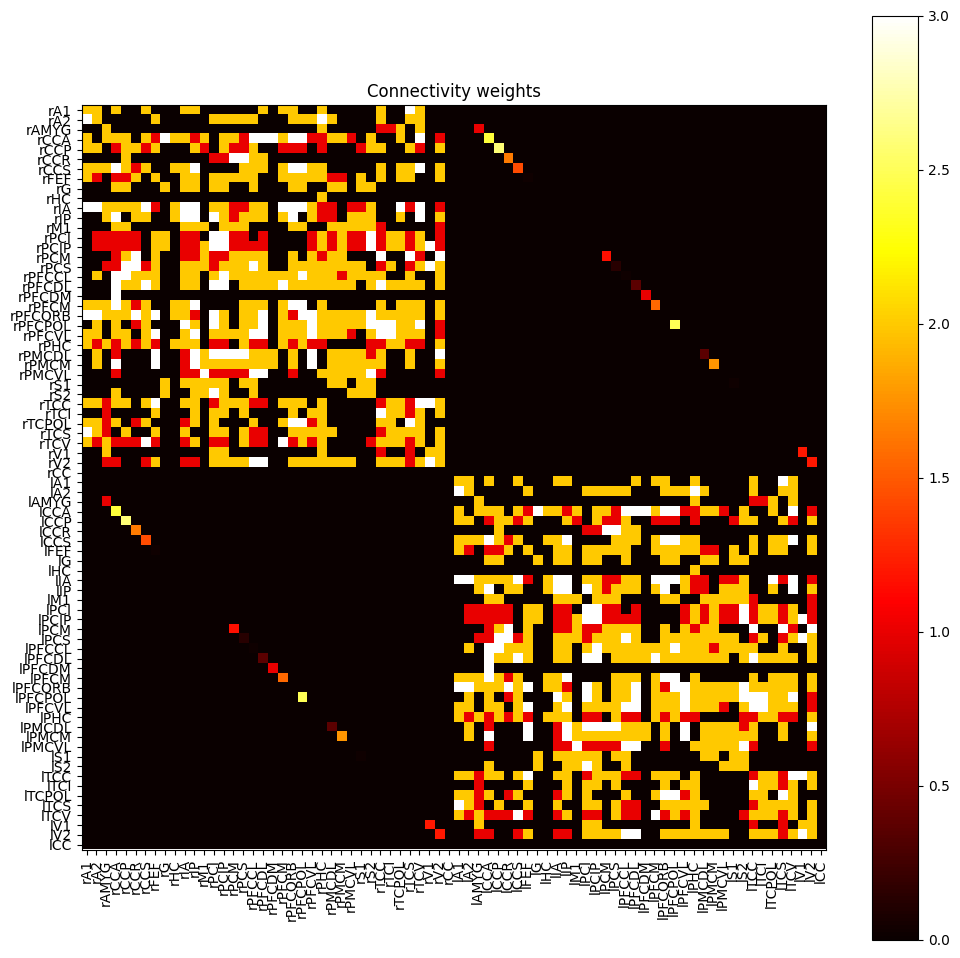

In [ ]:
# Visualize the connectivity weights
plt.figure(figsize=(12, 12))
plt.imshow(conn.weights, cmap='hot', interpolation='nearest')
plt.title('Connectivity weights')
plt.xticks(ticks=np.arange(len(labels)), labels=labels, rotation=90)
plt.yticks(ticks=np.arange(len(labels)), labels=labels)
plt.colorbar()

The upper left part of the graph represents the right hemisphere and the bottom right part the left hemisphere.

The connectivity tract lengths represent the length of myelinated fibre tracts between regions. They represent the distance between brain regions.

Text(0.5, 1.0, 'Connectivity tract lengths')

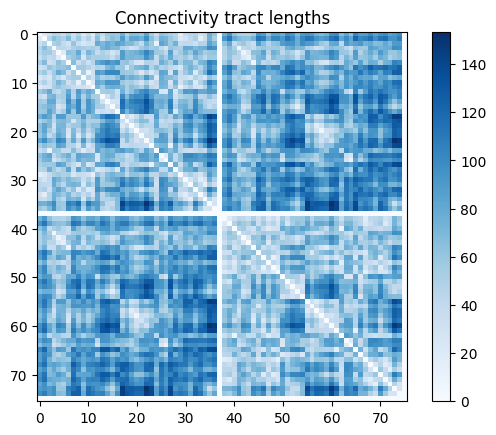

In [ ]:
# Visualize connectivity tract lengths
plt.imshow(conn.tract_lengths, cmap='Blues')
plt.colorbar()
plt.title('Connectivity tract lengths')

## Coupling

The coupling function define how the activity of a brain region is influenced by neighborhood regions.

Define the coupling as the difference between the pre-synaptic and post-synaptic activity.

In [ ]:
coup = coupling.Difference(a=np.array([1.0]))

In [ ]:
coup

## Integrator

The Integrators defines the integration scheme that will be applied to the coupled set of differential equations. It allows us to step through time to be able to complete a full simulation.

Define the noise, assuming the source of noise is a Gaussian with unit variance. The result will be noise with a std called `nsig`.

The noise is only added on the two variables of the second population (y3, y4). The populations are the different brain regions considered and defined in the epileptor.

In [ ]:
# Define the noise
noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))

In [ ]:
noise_add

Define the integrator, which defines the scheme that will be applied to the coupled set of differential equations.

In this case we used the Euler method, which is a first-order numerical procedure for solving ODEs.

In [ ]:
# Define the integrator
integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
    )

In [ ]:
integ

## Monitors

Monitors are used during the simulation to record the output obtained form the Simulator.

First define the default region mapping.

In [ ]:
# Default region mapping
rm = region_mapping.RegionMapping.from_file()

In [ ]:
rm

Define two Monitors that will act to record the output from the Simulator. They will output neuroimaging data.

- Temporal Average Monitor: averages over a time window of length period returning one time point every period ms
- EEG Monitor: apply an EEG measurement process to the simulated neural activity

In [ ]:
# Initialize the Temporal Average Monitor
mon_tavg = monitors.TemporalAverage(period=1.)

# Initialize the EEG Monitor
mon_EEG = monitors.EEG.from_file()
mon_EEG.region_mapping = rm           # Define the regions
mon_EEG.period = 1.                   # Define the sampling period


# Bundle them
monitor = (mon_tavg, mon_EEG)

## Simulator

Once all the components are defined bring them together into the Simulator.

In [ ]:
sim = simulator.Simulator(model = epileptor,
                          connectivity = conn,
                          coupling = coup,
                          integrator = integ,
                          monitors = monitor)

sim.configure()

2025-06-07 14:01:59,612 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)


## Stimulus propagation

- t_tavg, t_eeg: time axes
- tavg, eeg: time series signals

In [ ]:
(t_tavg, tavg), (t_eeg, eeg) = sim.run(simulation_length=10000)

Apply normalization to clean up and align the signals to have a better visualization.

In [ ]:
# Normalize the time series to have nice plots
tavg /= (np.max(tavg,0) - np.min(tavg,0 ))
eeg /= (np.max(eeg,0) - np.min(eeg,0 ))
eeg -= np.mean(eeg, 0)

### Visualize Epileptors time series

The following graph allows us to visualize the time series output for the 76 Epileptor models. Each Epileptor model (line) corresponds to a brain region.

We would expect to have some variations of the activity in the brain regions that we defined as epileptic.

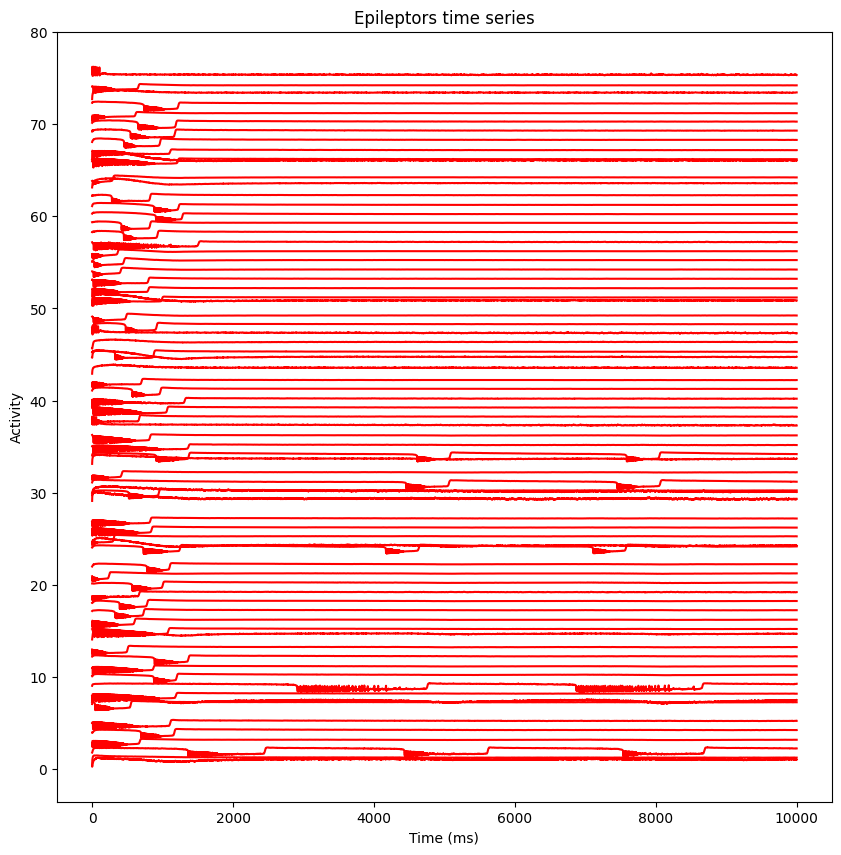

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(t_tavg[:], tavg[:, 0, :, 0] + np.r_[:76], 'r')
plt.title("Epileptors time series")
plt.xlabel("Time (ms)")
plt.ylabel("Activity")
plt.show()

As expected, we can observe some variations of the activity in the regions 24, 9, 2, 31 and 34.

We can also see that the regions defined as less epileptic (31, 34) have lass variation.

### Visualize EEG data

The following graph shows the data collected from the different EEG simulated channels (electrodes).

Each line represents the voltage activity for each channel over time, so we can observe how the seizure is likely to evolve in space and time across the brain.


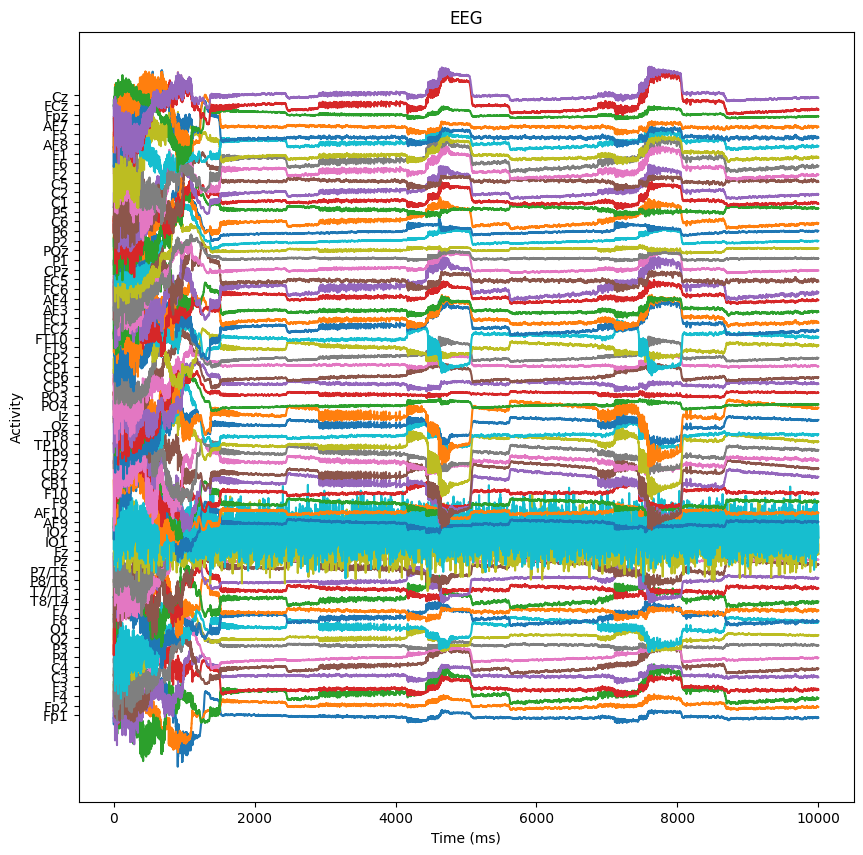

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(t_eeg[:], 10*eeg[:, 0, :, 0] + np.r_[:65])
plt.yticks(np.r_[:65], mon_EEG.sensors.labels)
plt.title("EEG")
plt.xlabel("Time (ms)")
plt.ylabel("Activity")
plt.show()

In this graph the smoother regions indicated normal brain activity, whereas the areas the areas showing abnormalities are associated to seizures.

# Simulate surgical resection

We want to simulate the effect of a surgical resection of the Epileptogenic Zone.

Surgical resections are used for epileptic patients whose seizures are drug-resistant.

To simulate the surgical resection of certain regions of the brain (the Epileptogenic Zone) we set their connections to 0 in the connectivity matrix.

Afterwards, the Epileptor Time Series and the EEG are plotted and analyzed, with the intent of understanding what zones are the most effective for curing epilepsy.

The following pieces of code are very useful functions created to avoid repeting code to create the plots.

In [ ]:
def plot_connectivity_weights(conn):
  # Plot connectivity weights
  plt.figure(figsize=(7, 7))
  plt.imshow(conn.weights[:38, :38], cmap='hot', interpolation='nearest')
  plt.title('Connectivity weights')
  plt.xticks(ticks=np.arange(len(labels[:38])), labels=labels[:38], rotation=90)
  plt.yticks(ticks=np.arange(len(labels[:38])), labels=labels[:38])
  plt.colorbar()

In [ ]:
def plot_connectivity_compare(conn1, conn2):
  plt.figure(figsize=(13, 5))

  # Before
  plt.subplot(1,2,1)
  plt.imshow(conn1.weights[:38, :38], cmap='hot', interpolation='nearest')
  plt.xticks(ticks=np.arange(len(labels[:38])), labels=labels[:38], rotation=90)
  plt.yticks(ticks=np.arange(len(labels[:38])), labels=labels[:38])
  plt.colorbar()


  # After
  plt.subplot(1,2,2)
  plt.imshow(conn2.weights[:38, :38], cmap='hot', interpolation='nearest')
  plt.xticks(ticks=np.arange(len(labels[:38])), labels=labels[:38], rotation=90)
  plt.yticks(ticks=np.arange(len(labels[:38])), labels=labels[:38])
  plt.colorbar()

In [ ]:
def plot_epileptor_time_series(t_tavg, tavg):
  plt.figure(figsize=(10,10))
  plt.plot(t_tavg[:], tavg[:, 0, :, 0] + np.r_[:76], 'r')
  plt.title("Epileptors time series")
  plt.xlabel("Time (ms)")
  plt.ylabel("Activity")
  plt.show()

In [ ]:
def plot_EEG(t_eeg, eeg, mon_EEG):
  plt.figure(figsize=(10,10))
  plt.plot(t_eeg[:], 10*eeg[:, 0, :, 0] + np.r_[:65])
  plt.yticks(np.r_[:65], mon_EEG.sensors.labels)
  plt.title("EEG")
  plt.xlabel("Time (ms)")
  plt.ylabel("Activity")
  plt.show()

Check that we are deactivating the correct regions in the right hemisphere:

In [ ]:
print("The epileptogenic zones:")
print(f"The region 2 is {labels[2]}")
print(f"The region 9 is {labels[9]}")
print(f"The region 24 is {labels[24]}")

print("\nThe lesser epileptogenic zones:")
print(f"The region 31 is {labels[31]}")
print(f"The region 34 is {labels[34]}")

The epileptogenic zones:
The region 2 is rAMYG
The region 9 is rHC
The region 24 is rPHC

The lesser epileptogenic zones:
The region 31 is rTCI
The region 34 is rTCV


## When deactivating more epileptogenic regions
Create functions that allows to deactivate epileptogenic regions, simulating a surgical resection. We defined these functions to avoid repeating code.

Function for deactivating 3 epileptogenic regions

In [ ]:
def deact_3zones(zone1, zone2, zone3, zone4, zone5):
  conn_deact = connectivity.Connectivity.from_file()

  # Deactivate zones
  conn_deact.weights[[zone1, zone2, zone3]] = 0.
  conn_deact.weights[:, [zone1, zone2, zone3]] = 0.
  conn_deact.speed = np.array([4.0])
  conn_deact.configure()

  # Create an Epileptor model instance
  epileptor_deact = models.Epileptor(
      x0=np.array([-1.6]),      # default
      tau = np.array([10]),     # default
      Iext = np.array([3.1]),   # default
      Ks=np.array([-0.2]),
      Kf=np.array([0.1]),
      r=np.array([0.00015])
  )

  # Base-line
  epileptor_deact.x0 = np.ones((76))*-2.4

  # Lesser epileptogenic regions
  epileptor_deact.x0[[zone4, zone5]] = np.ones((2))*-1.8

  # Coupling
  coup = coupling.Difference(a=np.array([1.0]))

  # Integrator
  noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
  integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
  )

  # Monitors
  #Initialise the TemporalAverage Monitor
  mon_tavg = monitors.TemporalAverage(period=1.)

  #Initialise the EEG Monitor
  mon_EEG = monitors.EEG.from_file()
  mon_EEG.region_mapping=rm           # Define the regions
  mon_EEG.period=1.                   # Define the sampling period

  # Bundle them
  monitor = (mon_tavg, mon_EEG)

  # Simulation
  sim = simulator.Simulator(model=epileptor_deact,
                          connectivity=conn_deact,
                          coupling=coup,
                          integrator=integ,
                          monitors=monitor)

  sim.configure()
  print(sim)

  (t_tavg_deact, tavg_deact), (t_eeg_deact, eeg_deact) = sim.run(simulation_length=10000)

  # Normalize the time series to have nice plots
  tavg_deact /= (np.max(tavg_deact,0) - np.min(tavg_deact,0 ))
  eeg_deact /= (np.max(eeg_deact,0) - np.min(eeg_deact,0 ))
  eeg_deact -= np.mean(eeg_deact, 0)

  return t_tavg_deact, tavg_deact, t_eeg_deact, eeg_deact, conn_deact, mon_EEG

Function for deactivating 2 epileptogenic regions

In [ ]:
def deact_2zones(zone1, zone2, zone3, zone4, zone5):
  conn_deact = connectivity.Connectivity.from_file()

  # Deactivate zones
  conn_deact.weights[[zone1, zone2]] = 0.
  conn_deact.weights[:, [zone1, zone2]] = 0.
  conn_deact.speed = np.array([4.0])
  conn_deact.configure()

  # Create an Epileptor model instance
  epileptor_deact = models.Epileptor(
      x0=np.array([-1.6]),      # default
      tau = np.array([10]),     # default
      Iext = np.array([3.1]),   # default
      Ks=np.array([-0.2]),
      Kf=np.array([0.1]),
      r=np.array([0.00015])
  )

  # Base-line
  epileptor_deact.x0 = np.ones((76))*-2.4

  # Epileptogenic regions
  epileptor_deact.x0[[zone3]] = np.ones((1))*-1.6

  # Lesser epileptogenic regions
  epileptor_deact.x0[[zone4, zone5]] = np.ones((2))*-1.8

  # Coupling
  coup = coupling.Difference(a=np.array([1.0]))

  # Integrator
  noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
  integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
  )

  # Monitors
  #Initialise the TemporalAverage Monitor
  mon_tavg = monitors.TemporalAverage(period=1.)

  #Initialise the EEG Monitor
  mon_EEG = monitors.EEG.from_file()
  mon_EEG.region_mapping=rm           # Define the regions
  mon_EEG.period=1.                   # Define the sampling period

  # Bundle them
  monitor = (mon_tavg, mon_EEG)

  # Simulation
  sim = simulator.Simulator(model=epileptor_deact,
                          connectivity=conn_deact,
                          coupling=coup,
                          integrator=integ,
                          monitors=monitor)

  sim.configure()
  print(sim)

  (t_tavg_deact, tavg_deact), (t_eeg_deact, eeg_deact) = sim.run(simulation_length=10000)

  # Normalize the time series to have nice plots
  tavg_deact /= (np.max(tavg_deact,0) - np.min(tavg_deact,0 ))
  eeg_deact /= (np.max(eeg_deact,0) - np.min(eeg_deact,0 ))
  eeg_deact -= np.mean(eeg_deact, 0)

  return t_tavg_deact, tavg_deact, t_eeg_deact, eeg_deact, conn_deact, mon_EEG

Function for deactivating one epileptogenic region

In [ ]:
def deact_1zones(zone1, zone2, zone3, zone4, zone5):
  conn_deact = connectivity.Connectivity.from_file()

  # Deactivate zones
  conn_deact.weights[[zone1]] = 0.
  conn_deact.weights[:, [zone1]] = 0.
  conn_deact.speed = np.array([4.0])
  conn_deact.configure()

  # Create an Epileptor model instance
  epileptor_deact = models.Epileptor(
      x0=np.array([-1.6]),      # default
      tau = np.array([10]),     # default
      Iext = np.array([3.1]),   # default
      Ks=np.array([-0.2]),
      Kf=np.array([0.1]),
      r=np.array([0.00015])
  )

  # Base-line
  epileptor_deact.x0 = np.ones((76))*-2.4

  # Epileptogenic regions
  epileptor_deact.x0[[zone2, zone3]] = np.ones((2))*-1.6

  # Lesser epileptogenic regions
  epileptor_deact.x0[[zone4, zone5]] = np.ones((2))*-1.8

  # Coupling
  coup = coupling.Difference(a=np.array([1.0]))

  # Integrator
  noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
  integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
  )

  # Monitors
  #Initialise the TemporalAverage Monitor
  mon_tavg = monitors.TemporalAverage(period=1.)

  #Initialise the EEG Monitor
  mon_EEG = monitors.EEG.from_file()
  mon_EEG.region_mapping=rm           # Define the regions
  mon_EEG.period=1.                   # Define the sampling period

  # Bundle them
  monitor = (mon_tavg, mon_EEG)

  # Simulation
  sim = simulator.Simulator(model=epileptor_deact,
                          connectivity=conn_deact,
                          coupling=coup,
                          integrator=integ,
                          monitors=monitor)

  sim.configure()
  print(sim)

  (t_tavg_deact, tavg_deact), (t_eeg_deact, eeg_deact) = sim.run(simulation_length=10000)

  # Normalize the time series to have nice plots
  tavg_deact /= (np.max(tavg_deact,0) - np.min(tavg_deact,0 ))
  eeg_deact /= (np.max(eeg_deact,0) - np.min(eeg_deact,0 ))
  eeg_deact -= np.mean(eeg_deact, 0)

  return t_tavg_deact, tavg_deact, t_eeg_deact, eeg_deact, conn_deact, mon_EEG

### Deactivating the regions 9, 2 and 24

In [ ]:
t_tavg_deact0, tavg_deact0, t_eeg_deact0, eeg_deact0, conn_deact0, mon_EEG0 = deact_3zones(9, 2, 24, 31, 34)

2025-06-07 14:11:15,137 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:11:15,207 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: b0aa4ee3-46dc-4df3-8d24-47ab84c77867
  coupling ......... Difference gid: 07b9f56e-89bd-4b28-9359-4f3eb20c83c9
  gid .............. UUID('65a14467-8829-4d2e-abcd-cf3fc0715394')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 073fdebe-c718-4b4d-a7c5-ec06353b9ef6
  model ............ Epileptor gid: f2ff4af1-41fc-4850-9325-6c9b4d56db16
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 65a14467-8829-4d2e-abcd-cf3fc0715394
)


We want to display the brain's right hemisphere (the one we are taking into consideration) to visualize the regions that we set to 0, those are the black rows and columns.

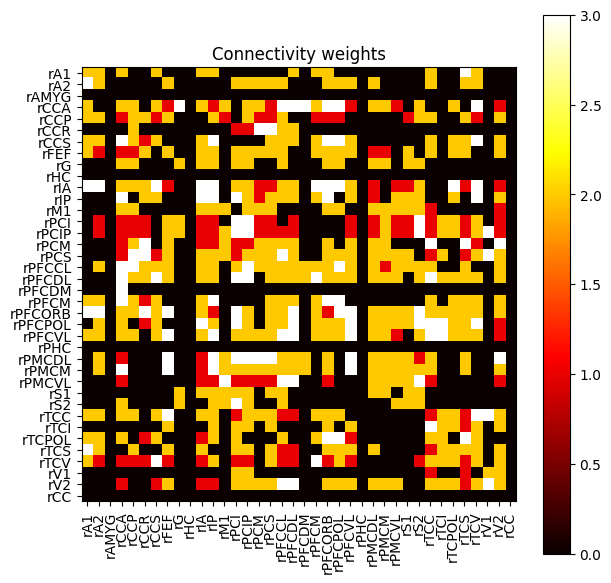

In [ ]:
plot_connectivity_weights(conn_deact0)

Display the right hemisphere before and after the deactivation of the areas 47, 40 and 62 to see how it changes.

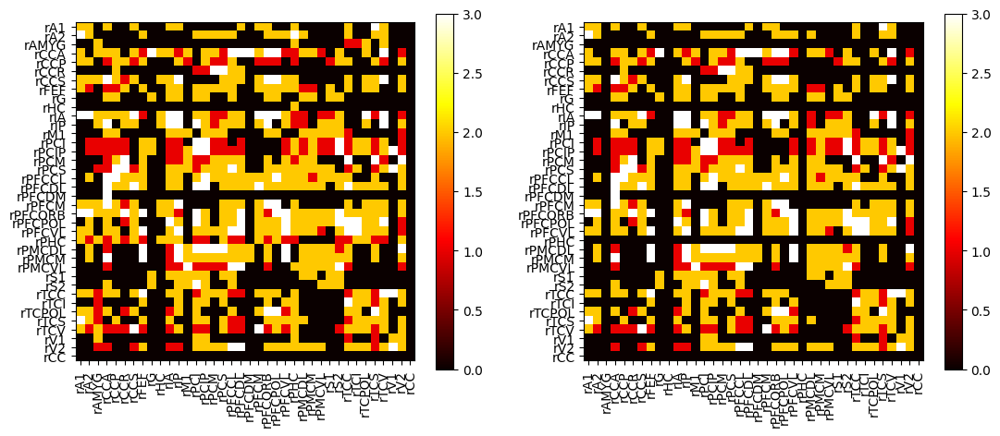

In [ ]:
plot_connectivity_compare(conn, conn_deact0)

Display the Epileptors time series plot.

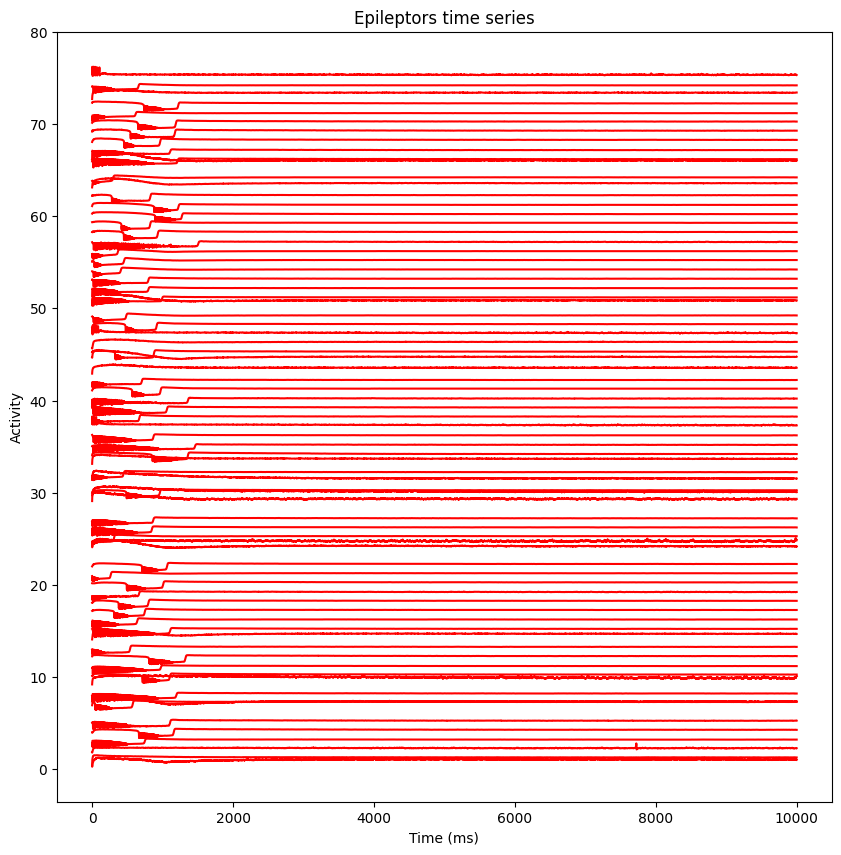

In [ ]:
plot_epileptor_time_series(t_tavg_deact0, tavg_deact0)

Display the EEG plot.

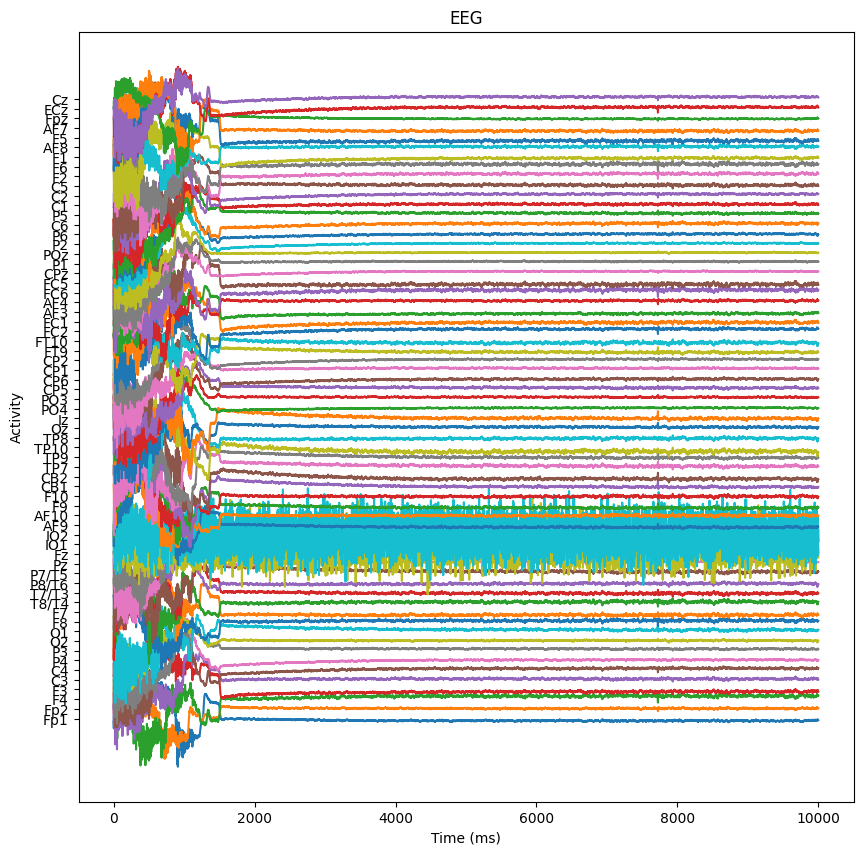

In [ ]:
plot_EEG(t_eeg_deact0, eeg_deact0, mon_EEG0)

### Deactivating the regions 9 and 2

In [ ]:
t_tavg_deact1, tavg_deact1, t_eeg_deact1, eeg_deact1, conn_deact1, mon_EEG1 = deact_2zones(9, 2, 24, 31, 34)

2025-06-07 14:13:18,460 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:13:18,527 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: fa1ddd16-981e-45d6-a5ec-dd3c32c05e5c
  coupling ......... Difference gid: 1be7ea6f-9b3e-4d63-b824-7cfb69266dd8
  gid .............. UUID('63789f9a-fe18-4bd5-85b7-fb42697844ac')
  initial_conditions  None
  integrator ....... HeunStochastic gid: e405e618-1c9e-4efe-9dcf-42f98d8a15d3
  model ............ Epileptor gid: e9ab7b86-0aaf-49f3-95e7-91aabfee994a
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 63789f9a-fe18-4bd5-85b7-fb42697844ac
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

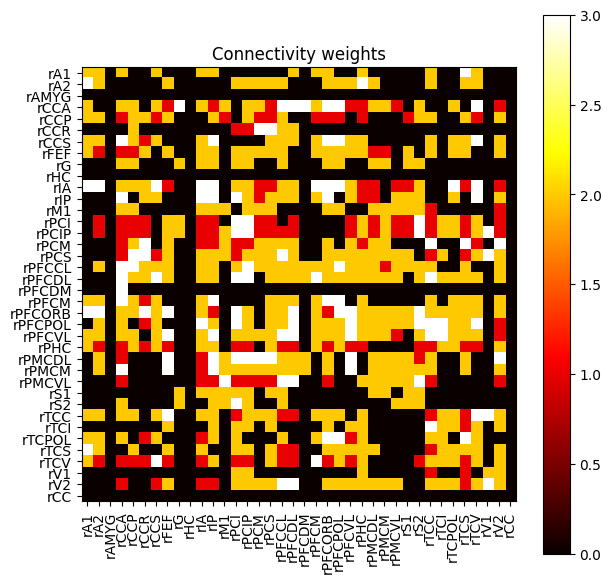

In [ ]:
plot_connectivity_weights(conn_deact1)

Display the right hemisphere before and after the deactivation of the areas 9 and 2 to see how it changes.

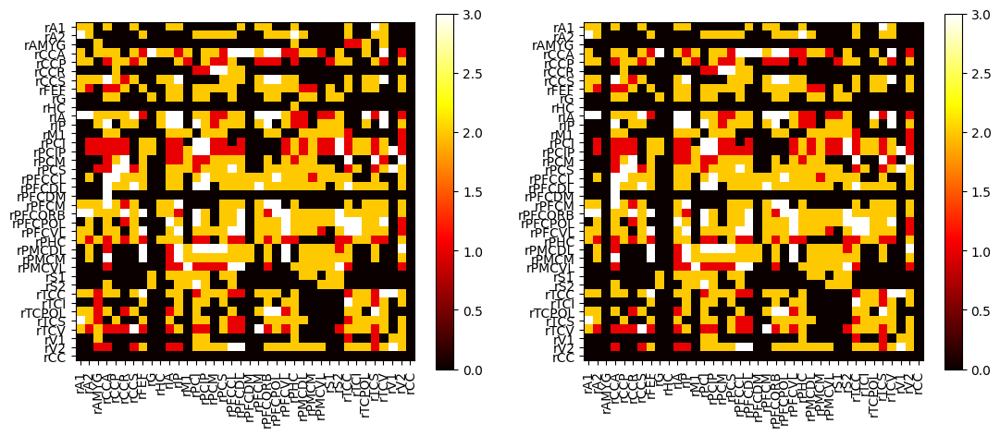

In [ ]:
plot_connectivity_compare(conn, conn_deact1)

Display the Epileptors time series plot.

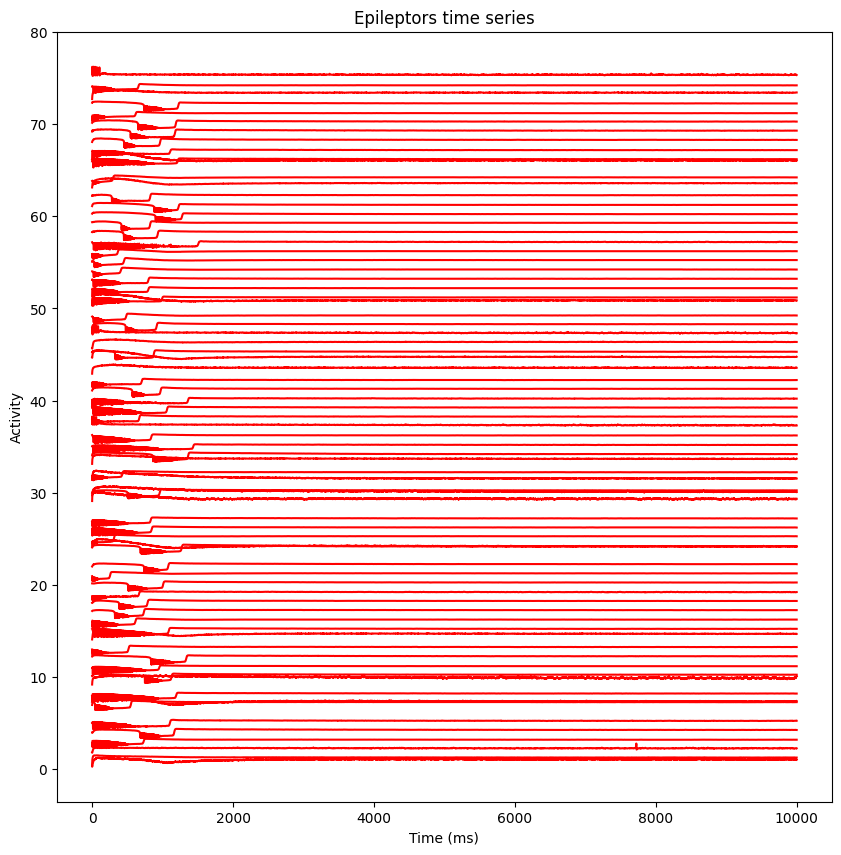

In [ ]:
plot_epileptor_time_series(t_tavg_deact1, tavg_deact1)

Display the EEG plot.

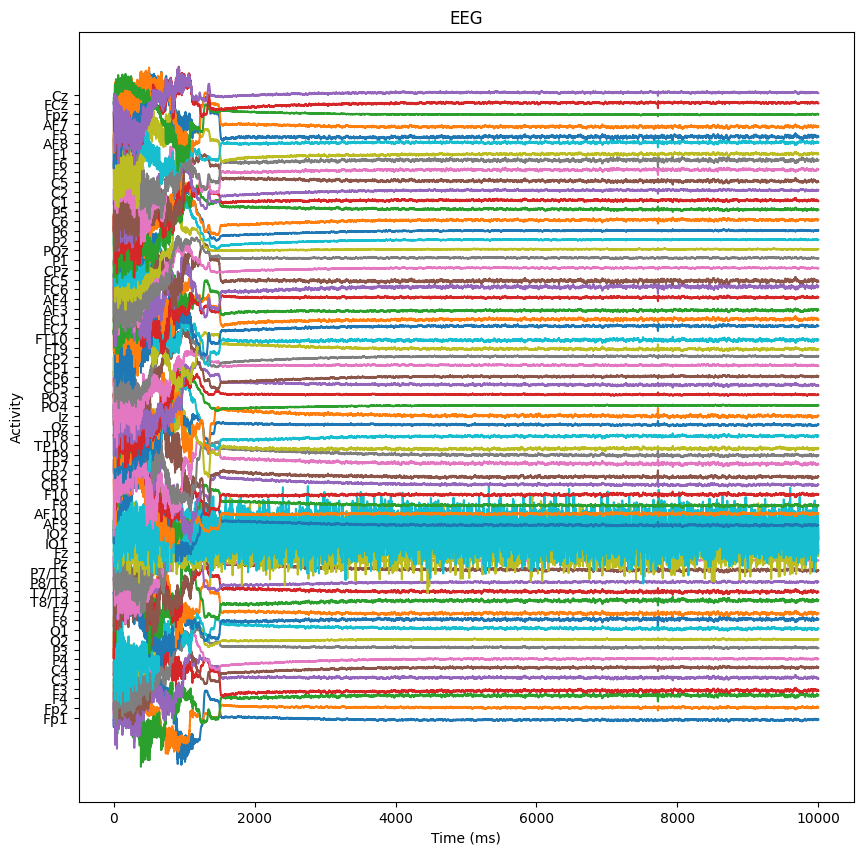

In [ ]:
plot_EEG(t_eeg_deact1, eeg_deact1, mon_EEG1)

### Deactivating the regions 24 and 9

In [ ]:
t_tavg_deact2, tavg_deact2, t_eeg_deact2, eeg_deact2, conn_deact2, mon_EEG2 = deact_2zones(24, 9, 2, 31, 34)

2025-06-07 14:14:51,730 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:14:51,812 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 1fa37518-50ec-4fc0-918e-4bde8cc62161
  coupling ......... Difference gid: 5d5d5e81-b276-4ed4-98b4-800f468600f3
  gid .............. UUID('883db6a8-b8b7-4637-81d3-a03ef27ac9a9')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 845043e5-03e3-4e78-b809-91c3f9ff4624
  model ............ Epileptor gid: 2a73594f-12b2-474b-abc6-c57596fe6ac8
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 883db6a8-b8b7-4637-81d3-a03ef27ac9a9
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

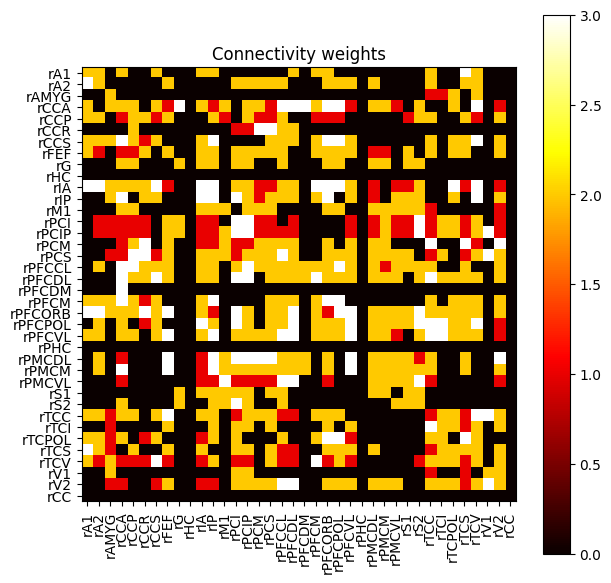

In [ ]:
plot_connectivity_weights(conn_deact2)

Display the right hemisphere before and after the deactivation of the areas 9 and 24 to see how it changes.

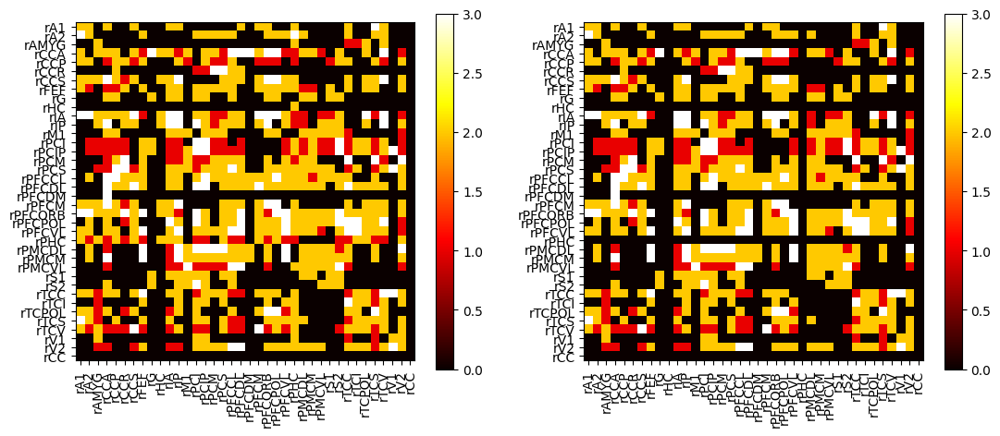

In [ ]:
plot_connectivity_compare(conn, conn_deact2)

Display the Epileptors time series plot.

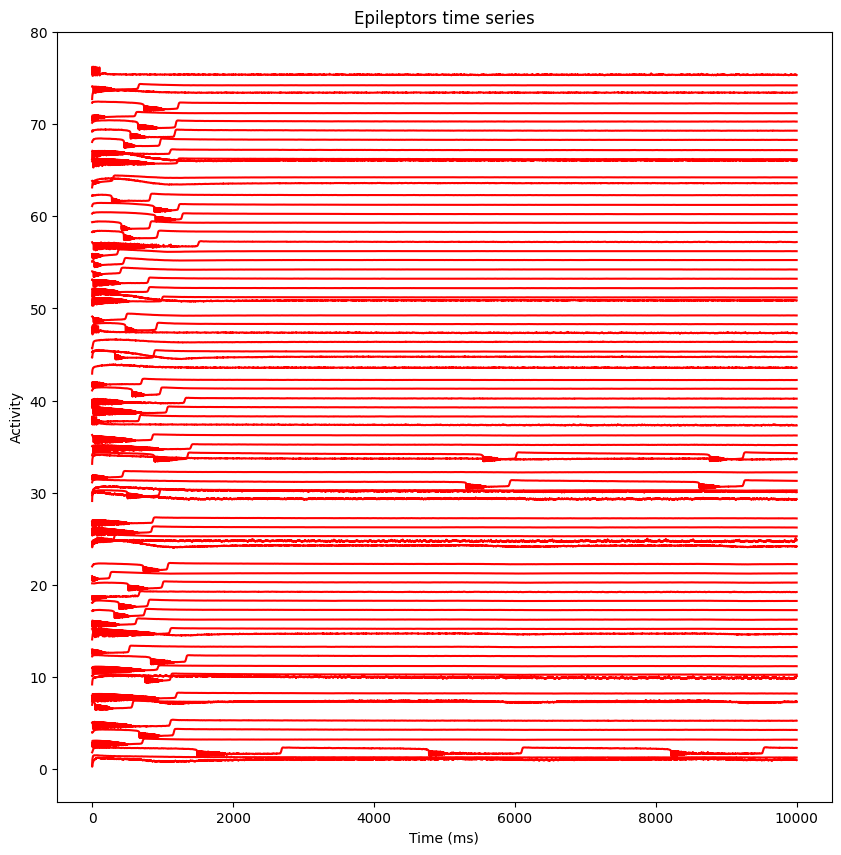

In [ ]:
plot_epileptor_time_series(t_tavg_deact2, tavg_deact2)

Display the EEG plot.

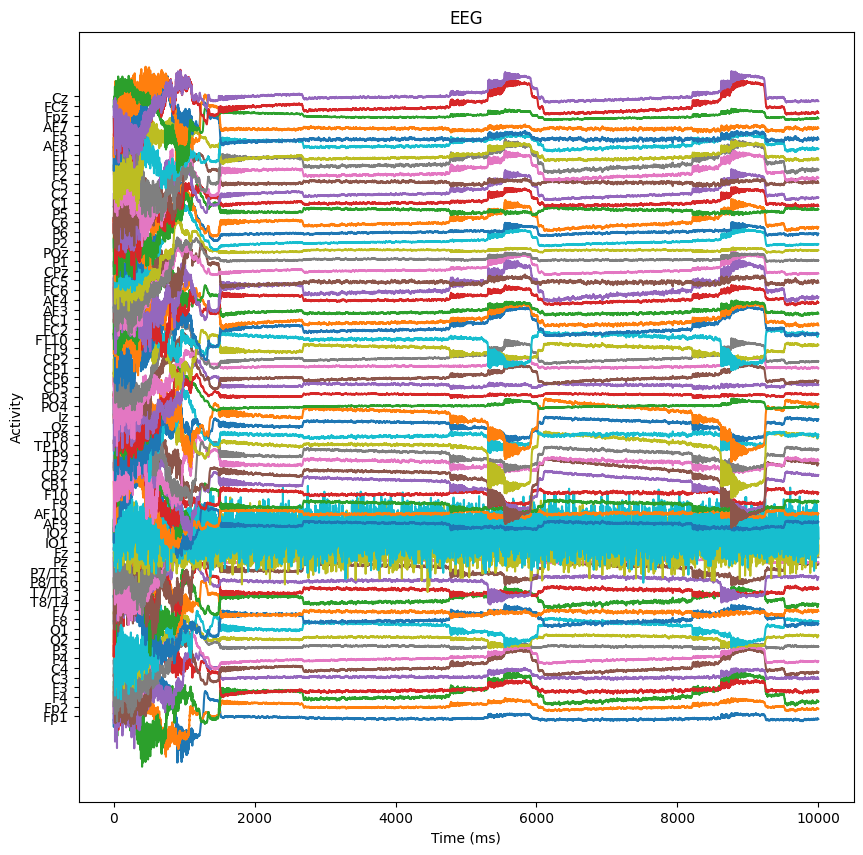

In [ ]:
plot_EEG(t_eeg_deact2, eeg_deact2, mon_EEG2)

### Deactivating the regions 24 and 2

In [ ]:
t_tavg_deact3, tavg_deact3, t_eeg_deact3, eeg_deact3, conn_deact3, mon_EEG3 = deact_2zones(24, 2, 9, 31, 34)

2025-06-07 14:16:28,991 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:16:29,105 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 6b7d2a81-ef36-4079-92f7-6078f10bc392
  coupling ......... Difference gid: b8549b1c-9285-4210-b938-1b0c537a3cdd
  gid .............. UUID('9d4db065-7531-4946-b2b2-f71a1247d3a3')
  initial_conditions  None
  integrator ....... HeunStochastic gid: c58132b1-2a66-4bd7-8292-9e2c60d190ac
  model ............ Epileptor gid: 09ac0b03-b59c-4157-b931-d76a02992d83
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 9d4db065-7531-4946-b2b2-f71a1247d3a3
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

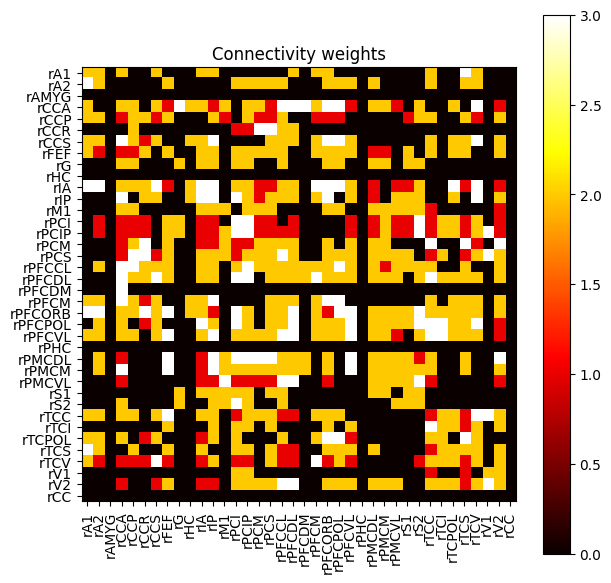

In [ ]:
plot_connectivity_weights(conn_deact3)

Display the right hemisphere before and after the deactivation of the areas 2 and 24 to see how it changes.

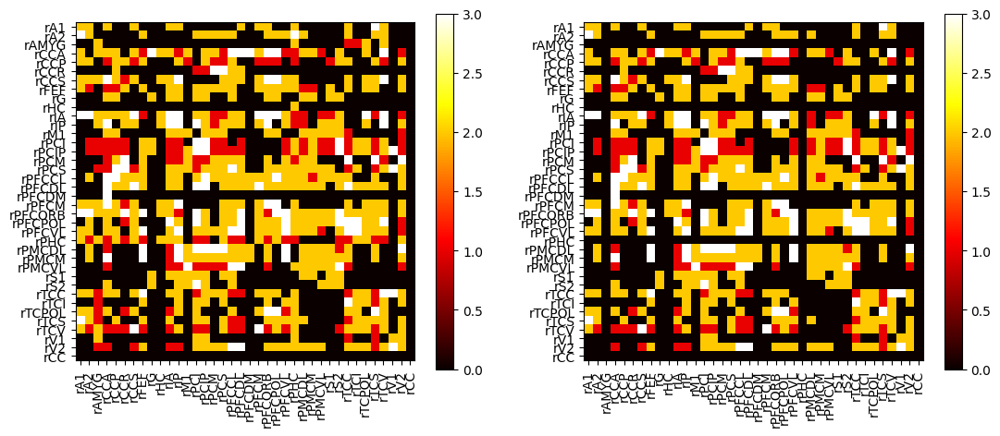

In [ ]:
plot_connectivity_compare(conn, conn_deact3)

Display the Epileptors time series plot.

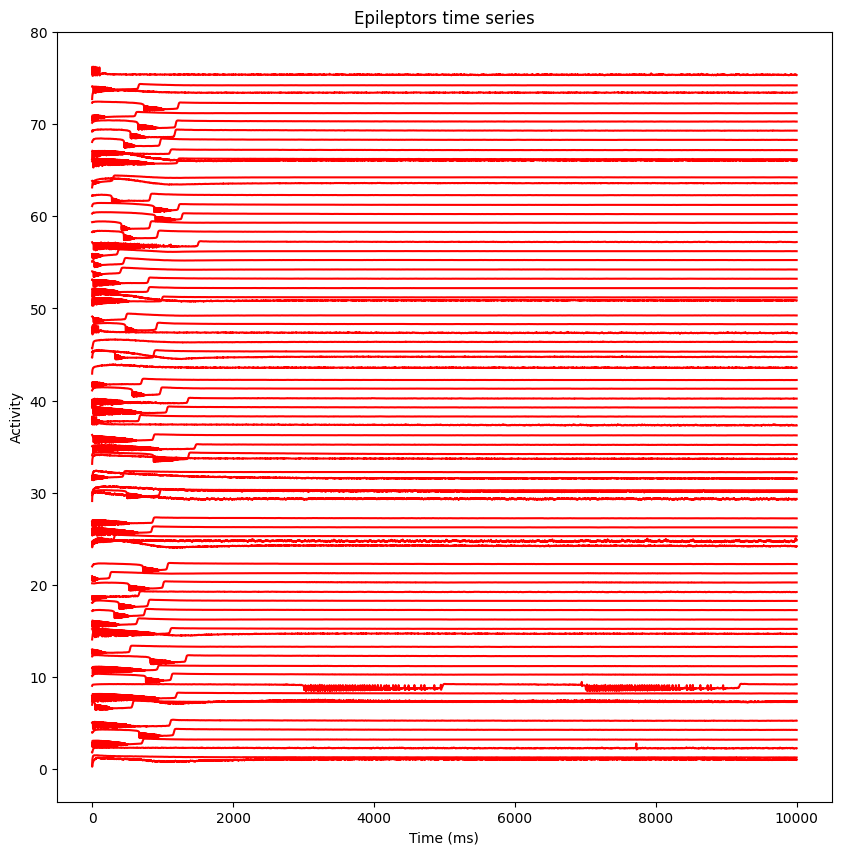

In [ ]:
plot_epileptor_time_series(t_tavg_deact3, tavg_deact3)

Display the EEG plot.

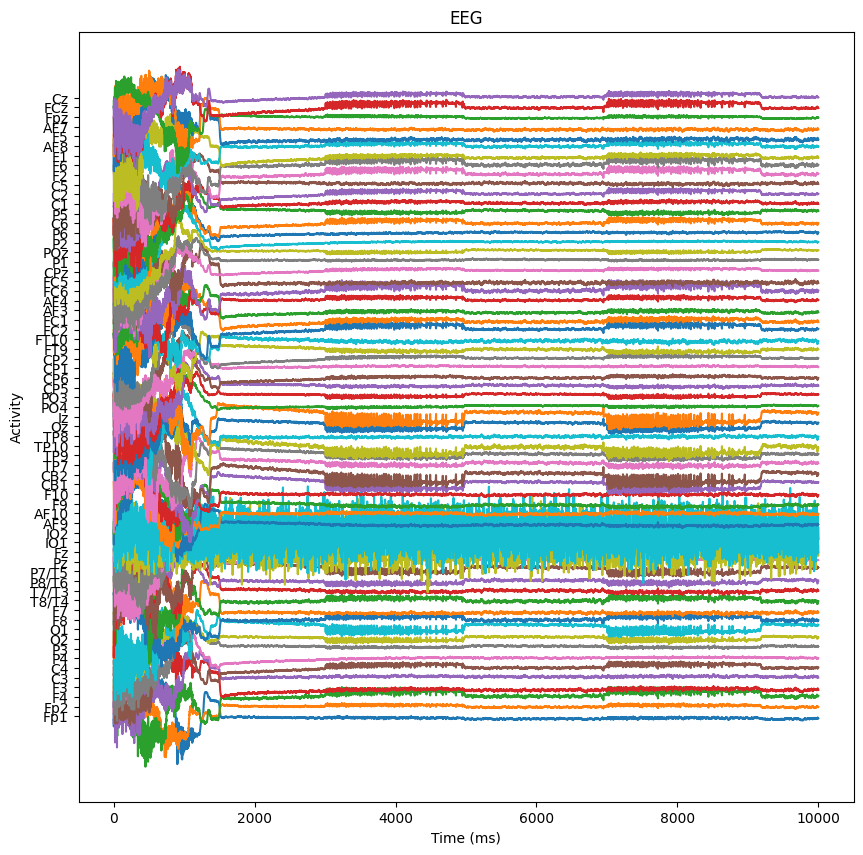

In [ ]:
plot_EEG(t_eeg_deact3, eeg_deact3, mon_EEG3)

### Deactivating the region 24

In [ ]:
t_tavg_deact4, tavg_deact4, t_eeg_deact4, eeg_deact4, conn_deact4, mon_EEG4 = deact_1zones(24, 9, 2, 31, 34)

2025-06-07 14:18:01,559 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:18:01,669 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: b724c4f8-443b-432e-ab46-0fc70823651c
  coupling ......... Difference gid: 88897178-981c-4cf0-888d-ae5f9a6f573e
  gid .............. UUID('7ead2066-9b64-4fc5-a529-8c0c90b750e5')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 1ee4f2a0-bbdd-46bb-91a3-ea927128941f
  model ............ Epileptor gid: 9ef33468-4218-408b-99d2-659a958e34b3
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 7ead2066-9b64-4fc5-a529-8c0c90b750e5
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

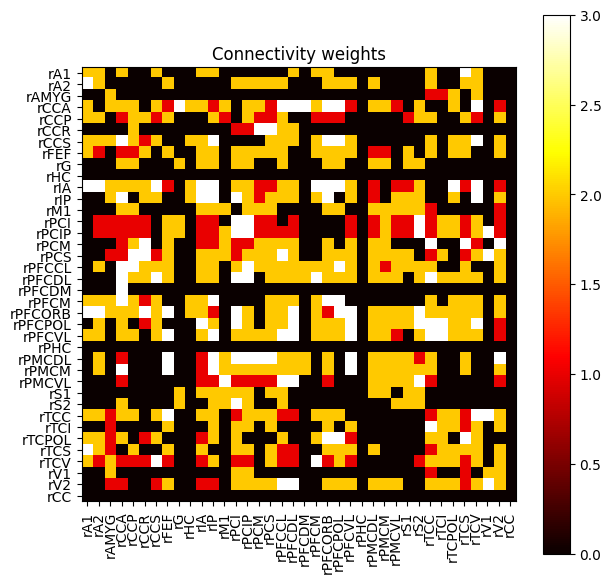

In [ ]:
plot_connectivity_weights(conn_deact4)

Display the right hemisphere before and after the deactivation of the area 24 to see how it changes.

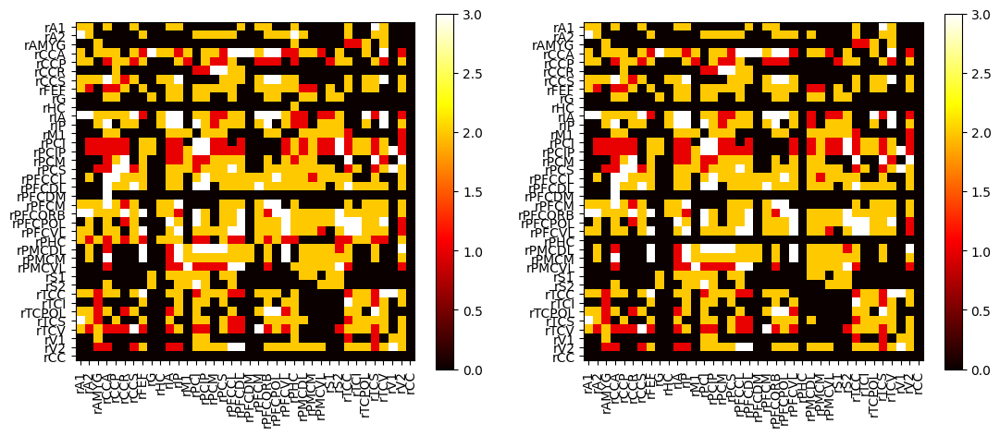

In [ ]:
plot_connectivity_compare(conn, conn_deact4)

Display the Epileptors time series plot.

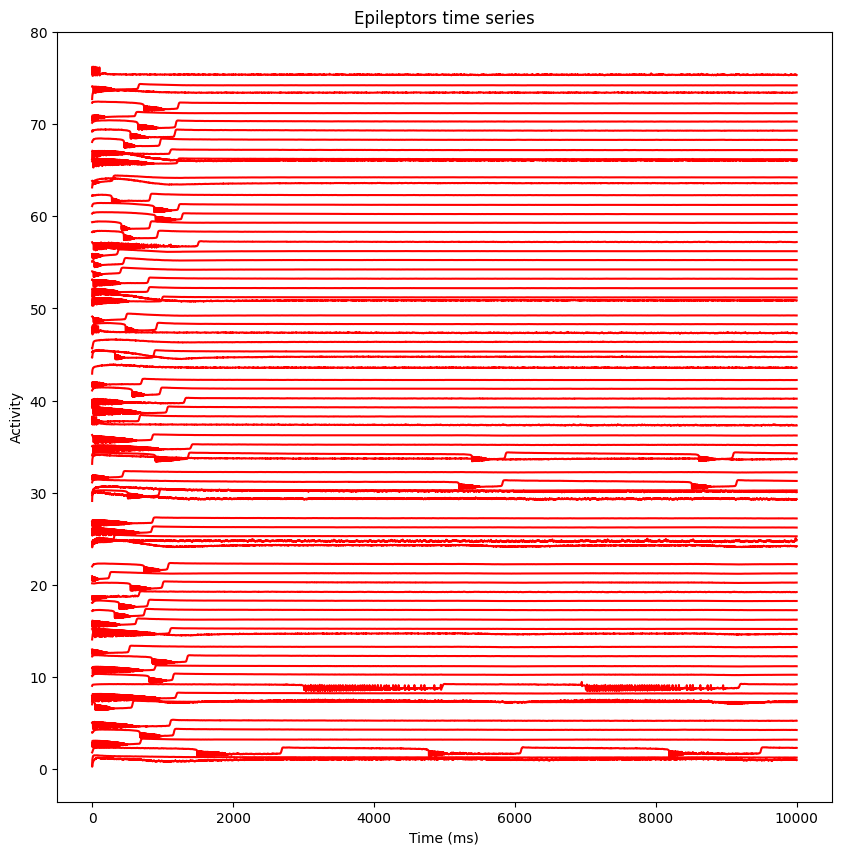

In [ ]:
plot_epileptor_time_series(t_tavg_deact4, tavg_deact4)

Display the EEG plot.

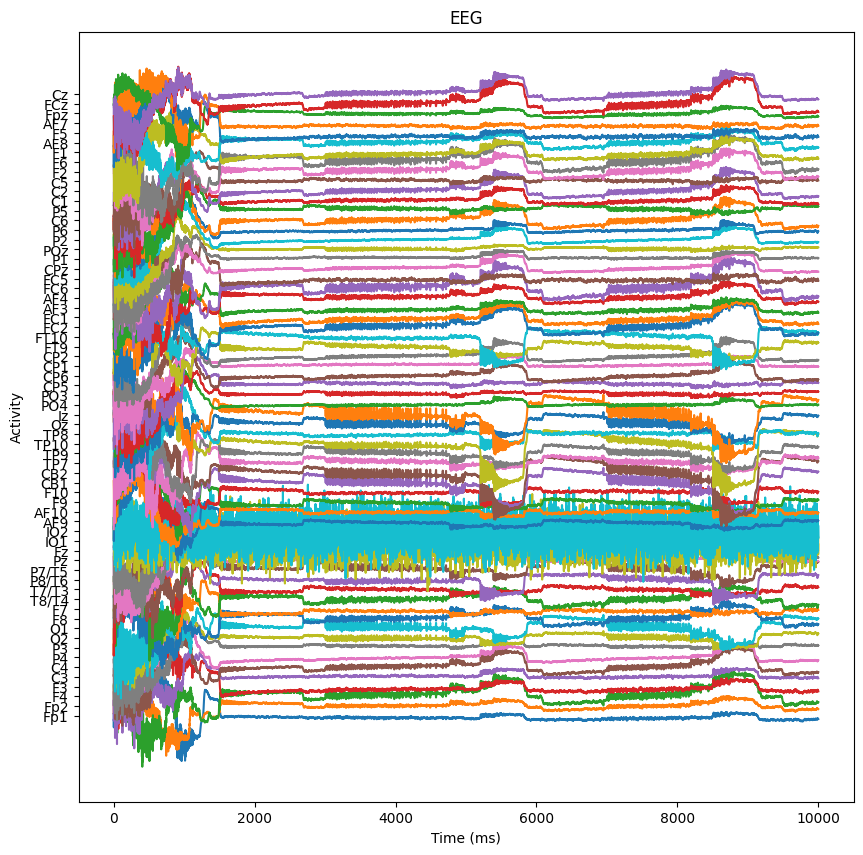

In [ ]:
plot_EEG(t_eeg_deact4, eeg_deact4, mon_EEG4)

### Deactivate the region 9

In [ ]:
t_tavg_deact5, tavg_deact5, t_eeg_deact5, eeg_deact5, conn_deact5, mon_EEG5 = deact_1zones(9, 24, 2, 31, 34)

2025-06-07 14:19:35,068 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:19:35,155 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: c30b01d7-d45e-4e1e-90bc-e6810bf1a4c5
  coupling ......... Difference gid: 729adccf-3b96-4131-95f9-9995e3aaf147
  gid .............. UUID('b5455539-16b2-4879-ab57-6c62acffc301')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 0172e11d-b55b-4005-9224-29be7e34ee1a
  model ............ Epileptor gid: 97f54091-7605-4326-baf8-0d9a9bd14a22
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: b5455539-16b2-4879-ab57-6c62acffc301
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

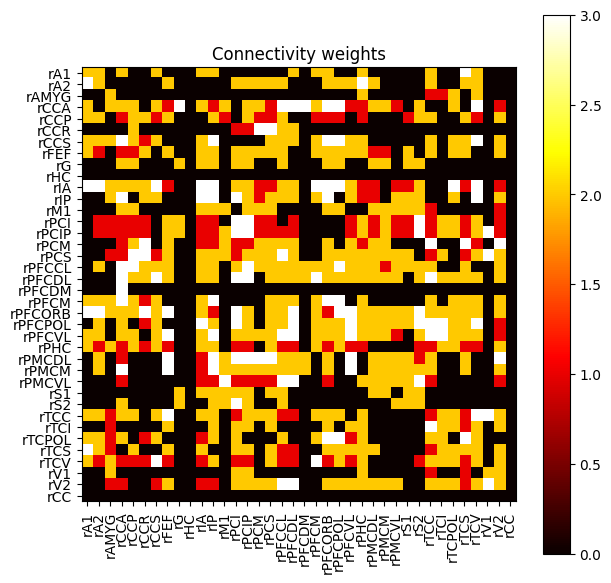

In [ ]:
plot_connectivity_weights(conn_deact5)

Display the right hemisphere before and after the deactivation of the area 9 to see how it changes.

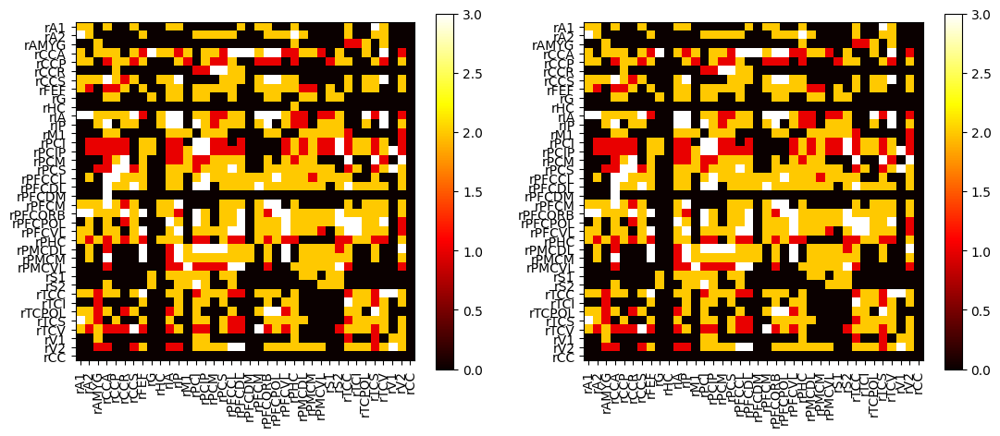

In [ ]:
plot_connectivity_compare(conn, conn_deact5)

Display the Epileptors time series plot.

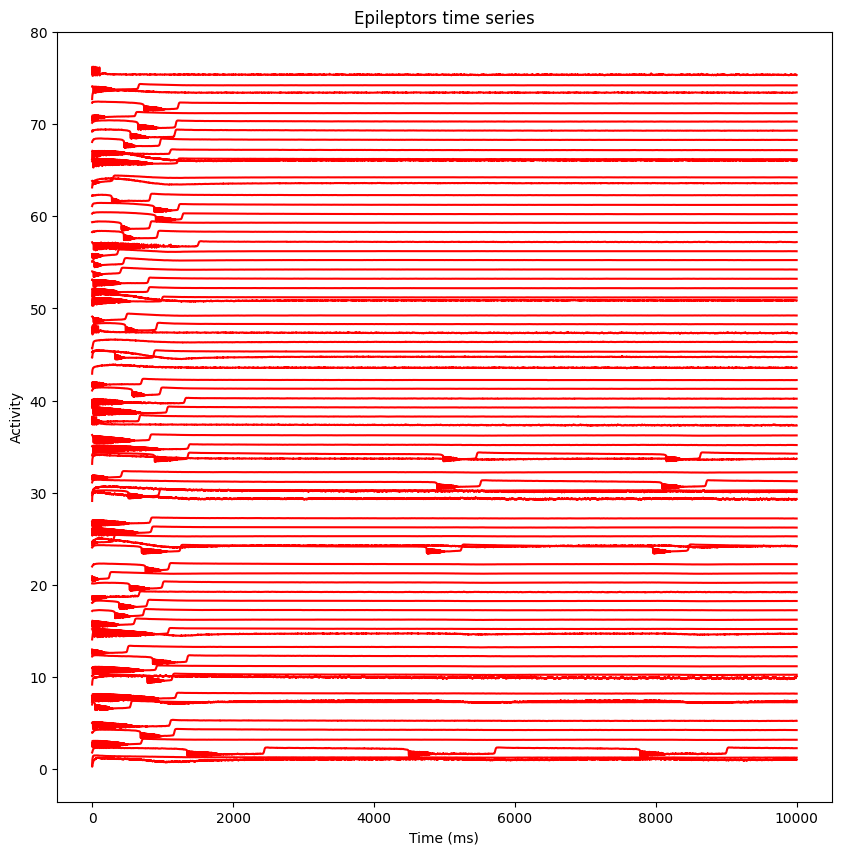

In [ ]:
plot_epileptor_time_series(t_tavg_deact5, tavg_deact5)

Display the EEG plot.

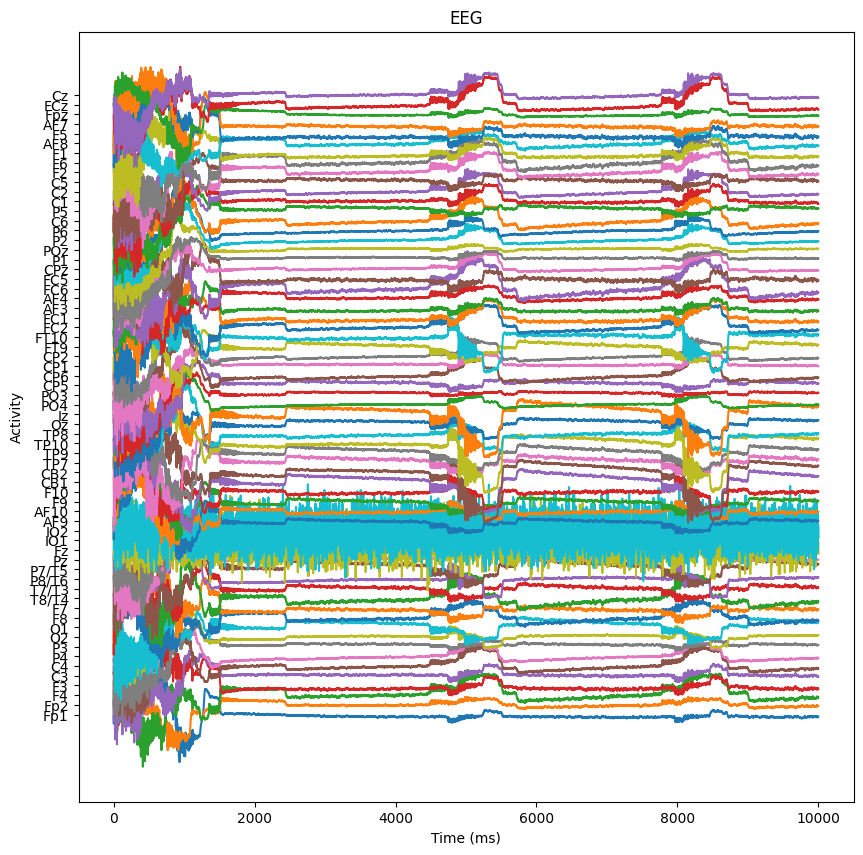

In [ ]:
plot_EEG(t_eeg_deact5, eeg_deact5, mon_EEG5)

### Deactivate the region 2

In [ ]:
t_tavg_deact6, tavg_deact6, t_eeg_deact6, eeg_deact6, conn_deact6, mon_EEG6 = deact_1zones(2, 9, 24, 31, 34)

2025-06-07 14:21:08,046 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:21:08,133 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: cd0d2d97-83d4-4fbc-b9ba-067d47bb9ec6
  coupling ......... Difference gid: 3cea57d8-9b33-4dfb-a0c5-1083c183bb33
  gid .............. UUID('cb755cfc-d20a-4433-aa96-8a2fa1c18a7c')
  initial_conditions  None
  integrator ....... HeunStochastic gid: a9dc2aa9-9b90-41ee-bc55-a17487722651
  model ............ Epileptor gid: 956b71ba-ab2f-43cf-bf78-145188204201
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: cb755cfc-d20a-4433-aa96-8a2fa1c18a7c
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

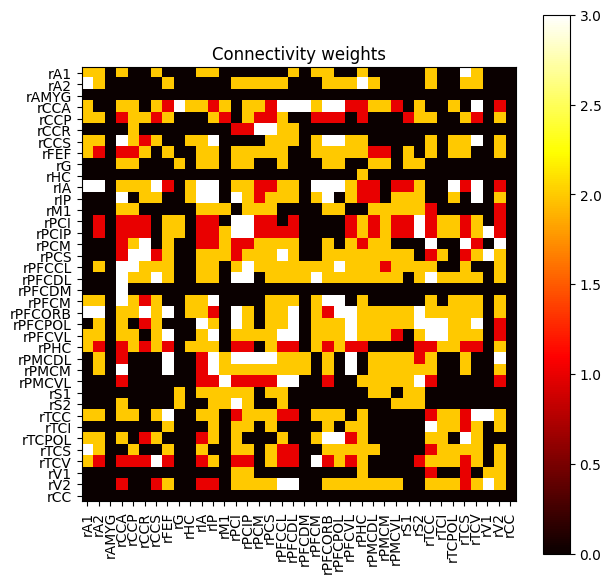

In [ ]:
plot_connectivity_weights(conn_deact6)

Display the right hemisphere before and after the deactivation of the area 2 to see how it changes.

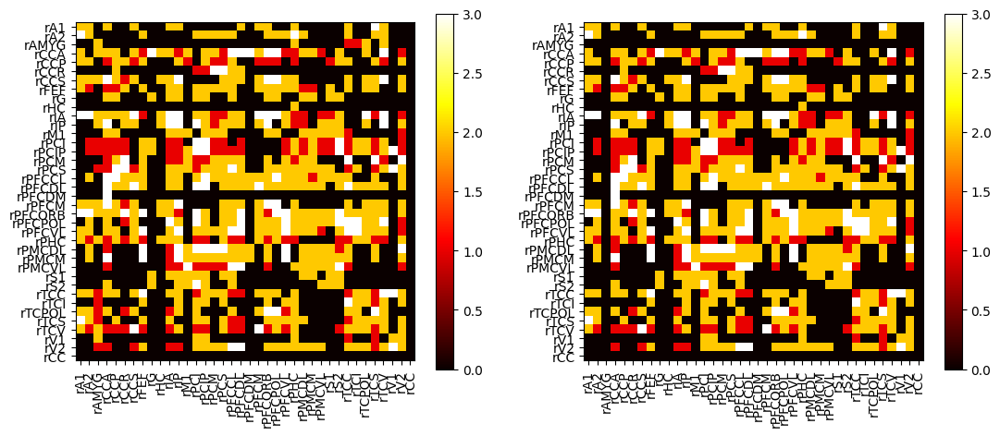

In [ ]:
plot_connectivity_compare(conn, conn_deact6)

Display the Epileptors time series plot.

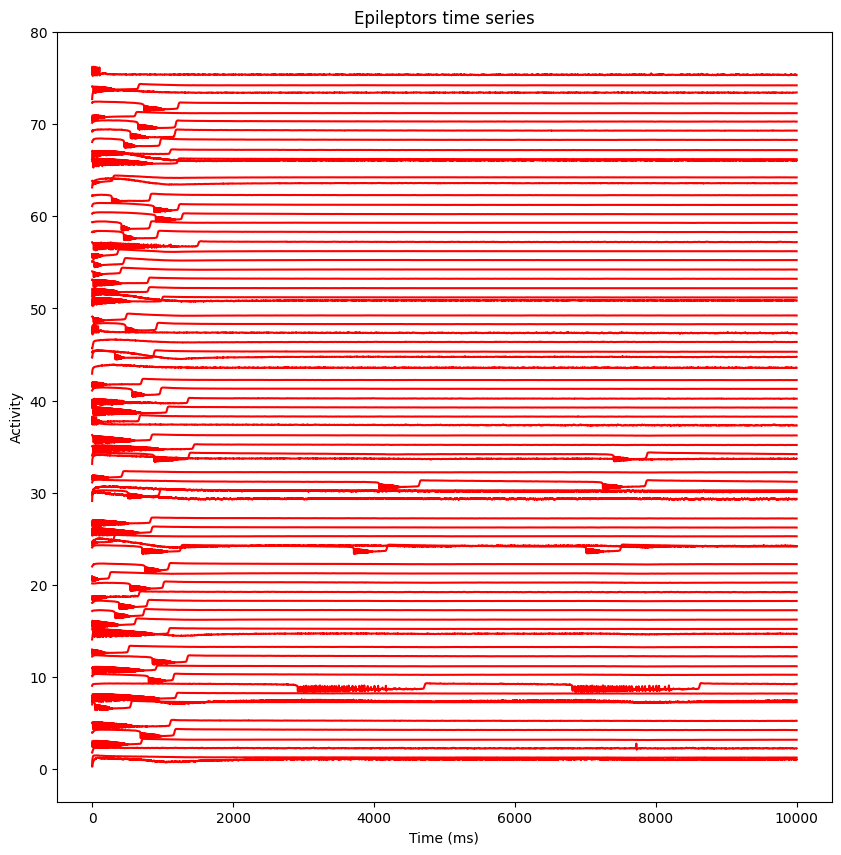

In [ ]:
plot_epileptor_time_series(t_tavg_deact6, tavg_deact6)

Display the EEG plot.

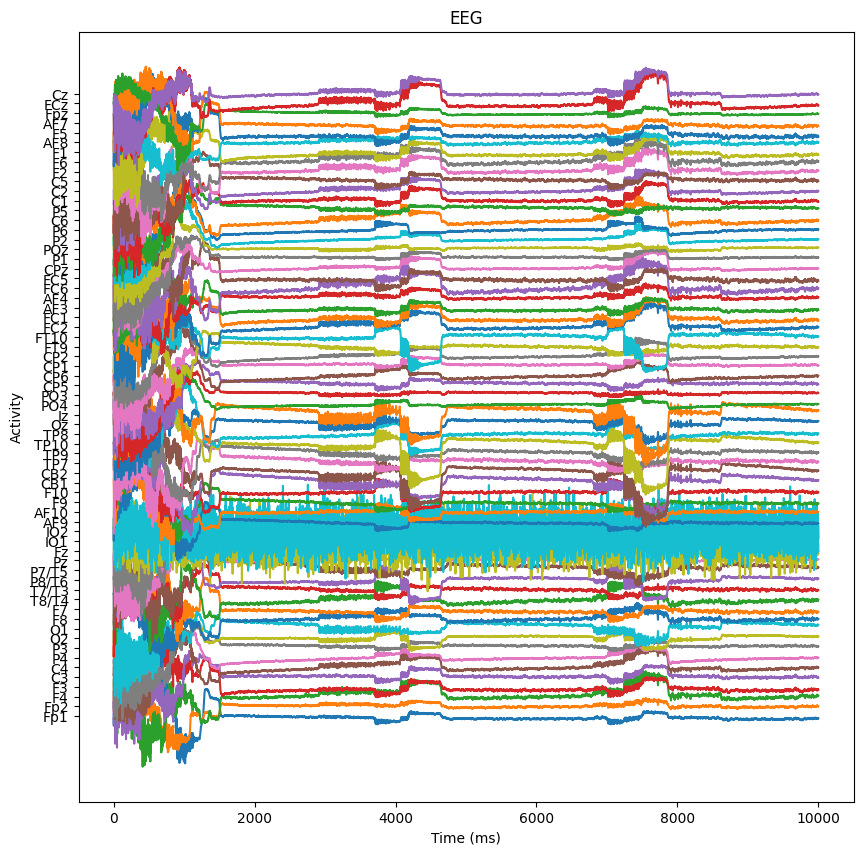

In [ ]:
plot_EEG(t_eeg_deact6, eeg_deact6, mon_EEG6)

## When deactivating lesser epileptogenic regions

Function for deactivating 2 lesser epileptogenic regions

In [ ]:
def deact_2lessEpZones(zone1, zone2, zone3, zone4, zone5):
  conn_deact = connectivity.Connectivity.from_file()

  # Deactivate zones
  conn_deact.weights[[zone4, zone5]] = 0.
  conn_deact.weights[:, [zone4, zone5]] = 0.
  conn_deact.speed = np.array([4.0])
  conn_deact.configure()

  # Create an Epileptor model instance
  epileptor_deact = models.Epileptor(
      x0=np.array([-1.6]),      # default
      tau = np.array([10]),     # default
      Iext = np.array([3.1]),   # default
      Ks=np.array([-0.2]),
      Kf=np.array([0.1]),
      r=np.array([0.00015])
  )

  # Base-line
  epileptor_deact.x0 = np.ones((76))*-2.4

  # Epileptogenic regions
  epileptor_deact.x0[[zone1, zone2, zone3]] = np.ones((3))*-1.6

  # Coupling
  coup = coupling.Difference(a=np.array([1.0]))

  # Integrator
  noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
  integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
  )

  # Monitors
  #Initialise the TemporalAverage Monitor
  mon_tavg = monitors.TemporalAverage(period=1.)

  #Initialise the EEG Monitor
  mon_EEG = monitors.EEG.from_file()
  mon_EEG.region_mapping=rm           # Define the regions
  mon_EEG.period=1.                   # Define the sampling period

  # Bundle them
  monitor = (mon_tavg, mon_EEG)

  # Simulation
  sim = simulator.Simulator(model=epileptor_deact,
                          connectivity=conn_deact,
                          coupling=coup,
                          integrator=integ,
                          monitors=monitor)

  sim.configure()
  print(sim)

  (t_tavg_deact, tavg_deact), (t_eeg_deact, eeg_deact) = sim.run(simulation_length=10000)

  # Normalize the time series to have nice plots
  tavg_deact /= (np.max(tavg_deact,0) - np.min(tavg_deact,0 ))
  eeg_deact /= (np.max(eeg_deact,0) - np.min(eeg_deact,0 ))
  eeg_deact -= np.mean(eeg_deact, 0)

  return t_tavg_deact, tavg_deact, t_eeg_deact, eeg_deact, conn_deact, mon_EEG

### Deactivating the regions 31 and 34

In [ ]:
t_tavg_deact7, tavg_deact7, t_eeg_deact7, eeg_deact7, conn_deact7, mon_EEG7 = deact_2lessEpZones(9, 2, 24, 31, 34)

2025-06-07 14:22:44,127 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:22:44,208 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 87f9f6d2-145b-42a6-a7ae-5af7488e8574
  coupling ......... Difference gid: 1532f430-1e03-4101-afda-b0a5c42b820d
  gid .............. UUID('d8173b00-54a7-4996-bf13-c6a3d6ac8fea')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 2f3a9165-bf4b-4942-aca7-6c5217824778
  model ............ Epileptor gid: df7f9e99-d787-4921-8fd8-5e4223a048ff
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: d8173b00-54a7-4996-bf13-c6a3d6ac8fea
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

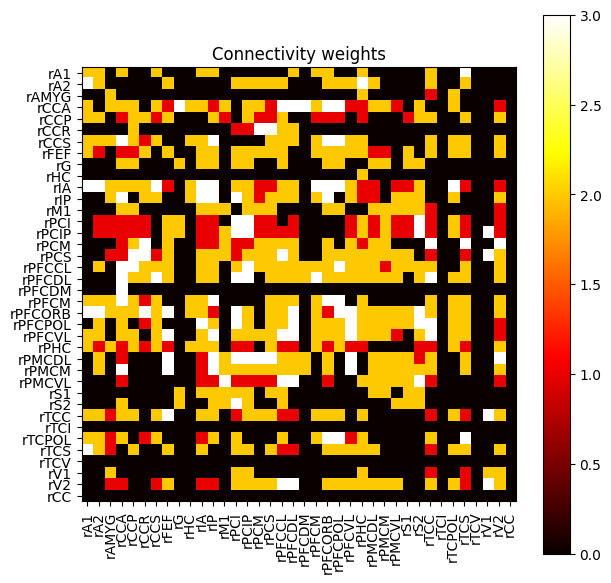

In [ ]:
plot_connectivity_weights(conn_deact7)

Display the right hemisphere before and after the deactivation of the areas 31 and 34 to see how it changes.

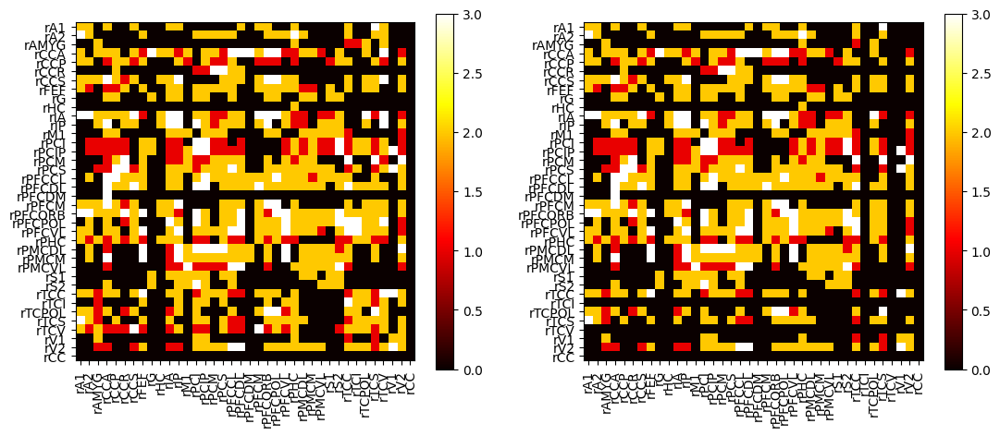

In [ ]:
plot_connectivity_compare(conn, conn_deact7)

Display the Epileptors time series plot.

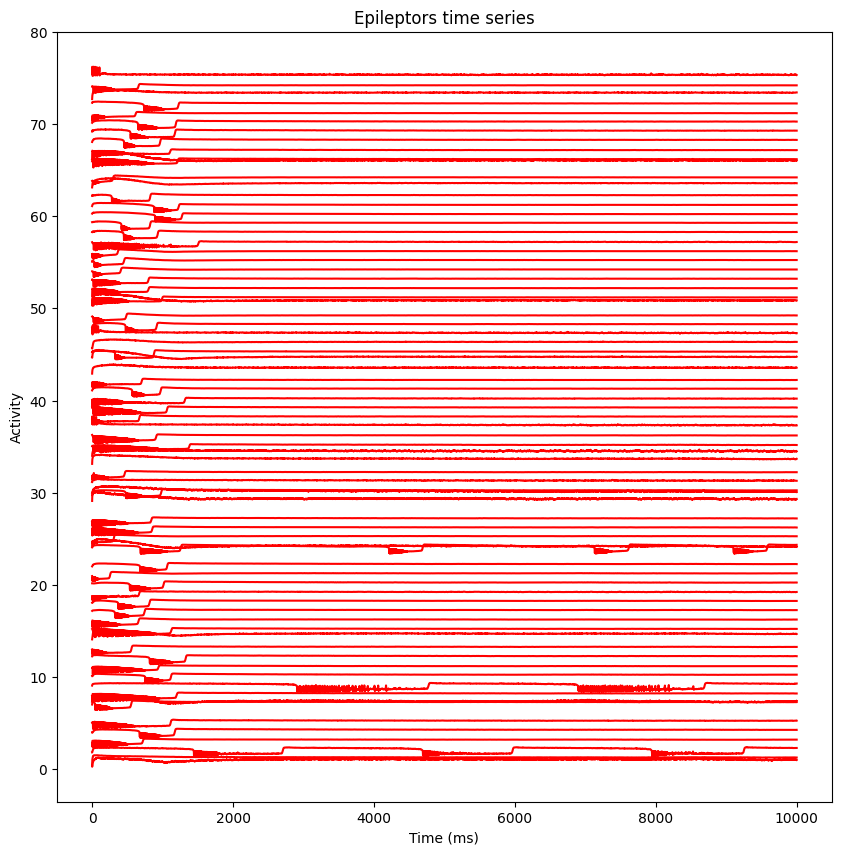

In [ ]:
plot_epileptor_time_series(t_tavg_deact7, tavg_deact7)

Display the EEG plot.

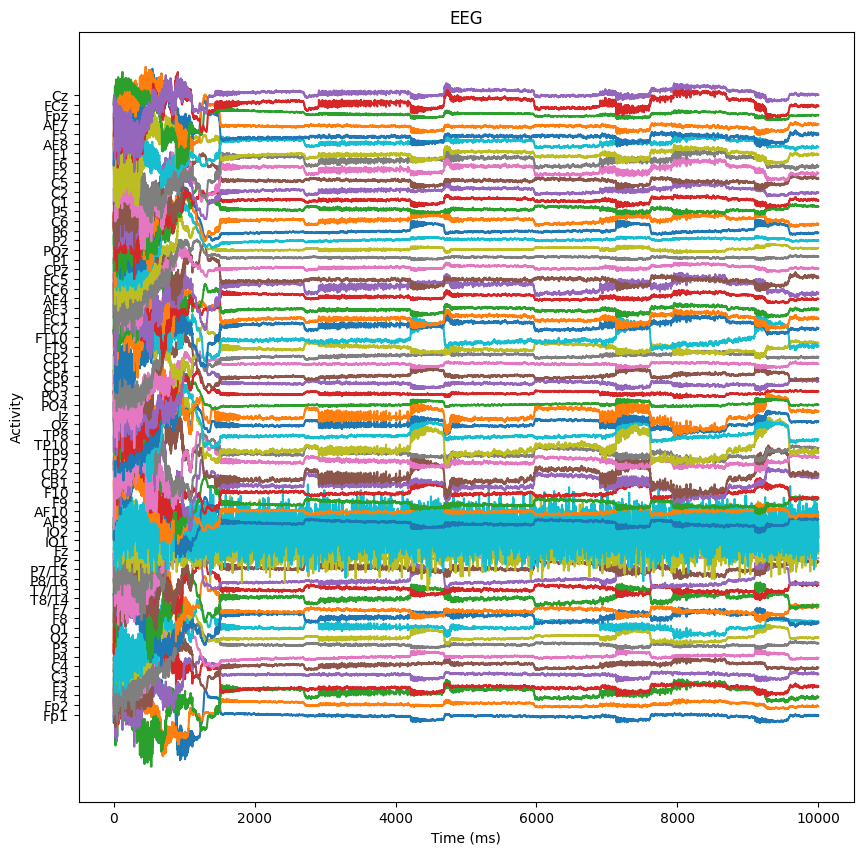

In [ ]:
plot_EEG(t_eeg_deact7, eeg_deact7, mon_EEG7)

## When deactivating both epileptogenic regions and lesser epileptogenic regions

Function for deactivating 1 epileptogenic region and 1 lesser epileptogenic region

In [ ]:
def deact_BothZones(zone1, zone2, zone3, zone4, zone5):
  conn_deact = connectivity.Connectivity.from_file()

  # Deactivate zones
  conn_deact.weights[[zone1, zone4]] = 0.
  conn_deact.weights[:, [zone1, zone4]] = 0.
  conn_deact.speed = np.array([4.0])
  conn_deact.configure()

  # Create an Epileptor model instance
  epileptor_deact = models.Epileptor(
      x0=np.array([-1.6]),      # default
      tau = np.array([10]),     # default
      Iext = np.array([3.1]),   # default
      Ks=np.array([-0.2]),
      Kf=np.array([0.1]),
      r=np.array([0.00015])
  )

  # Base-line
  epileptor_deact.x0 = np.ones((76))*-2.4

  # Epileptogenic regions
  epileptor_deact.x0[[zone2, zone3]] = np.ones((2))*-1.6
  # Lesser epileptogenic regions
  epileptor_deact.x0[[zone5]] = np.ones((1))*-1.8

  # Coupling
  coup = coupling.Difference(a=np.array([1.0]))

  # Integrator
  noise_add = noise.Additive(nsig = np.array([0., 0., 0., 0.0003, 0.0003, 0.]))
  integ = integrators.HeunStochastic(
    dt=0.05,         # Step size (ms)
    noise=noise_add  # Noise
  )

  # Monitors
  #Initialise the TemporalAverage Monitor
  mon_tavg = monitors.TemporalAverage(period=1.)

  #Initialise the EEG Monitor
  mon_EEG = monitors.EEG.from_file()
  mon_EEG.region_mapping=rm           # Define the regions
  mon_EEG.period=1.                   # Define the sampling period

  # Bundle them
  monitor = (mon_tavg, mon_EEG)

  # Simulation
  sim = simulator.Simulator(model=epileptor_deact,
                          connectivity=conn_deact,
                          coupling=coup,
                          integrator=integ,
                          monitors=monitor)

  sim.configure()
  print(sim)

  (t_tavg_deact, tavg_deact), (t_eeg_deact, eeg_deact) = sim.run(simulation_length=10000)

  # Normalize the time series to have nice plots
  tavg_deact /= (np.max(tavg_deact,0) - np.min(tavg_deact,0 ))
  eeg_deact /= (np.max(eeg_deact,0) - np.min(eeg_deact,0 ))
  eeg_deact -= np.mean(eeg_deact, 0)

  return t_tavg_deact, tavg_deact, t_eeg_deact, eeg_deact, conn_deact, mon_EEG

### Deactivating the regions 2 and 31


In [ ]:
t_tavg_deact8, tavg_deact8, t_eeg_deact8, eeg_deact8, conn_deact8, mon_EEG8 = deact_BothZones(2, 9, 24, 31, 34)

2025-06-07 14:24:19,813 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:24:19,928 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 1e747ecd-af33-469f-b6bf-3b96cb82c4ad
  coupling ......... Difference gid: 27cc7553-a52d-4908-bc67-f7bc6e0a4d1c
  gid .............. UUID('57cc1ebe-af54-4323-8906-02622dc71229')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 74128e31-9436-4049-bf22-5e28a6e84bd2
  model ............ Epileptor gid: c14e31b4-b6bd-422c-83f3-2fd621690521
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 57cc1ebe-af54-4323-8906-02622dc71229
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

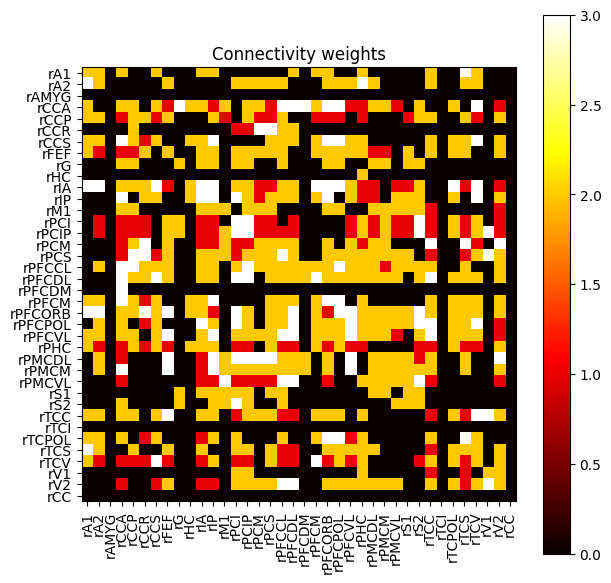

In [ ]:
plot_connectivity_weights(conn_deact8)

Display the right hemisphere before and after the deactivation of the areas 2 and 31 to see how it changes.

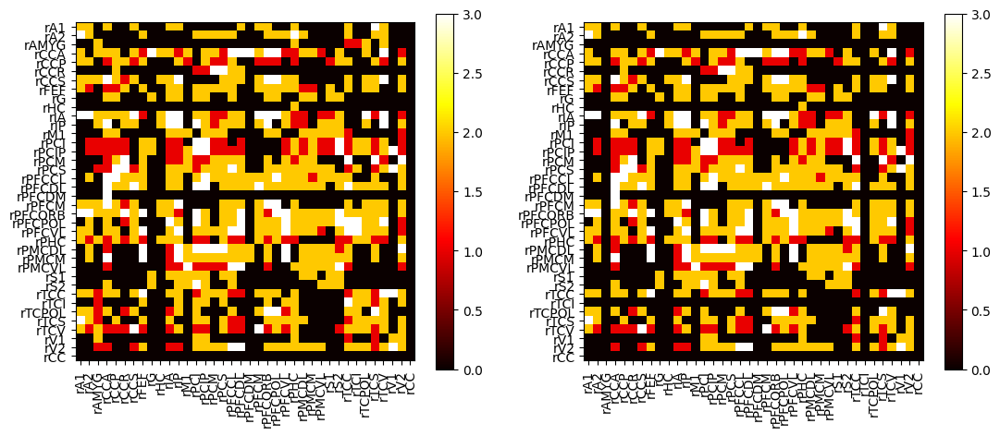

In [ ]:
plot_connectivity_compare(conn, conn_deact8)

Display the Epileptors time series plot.

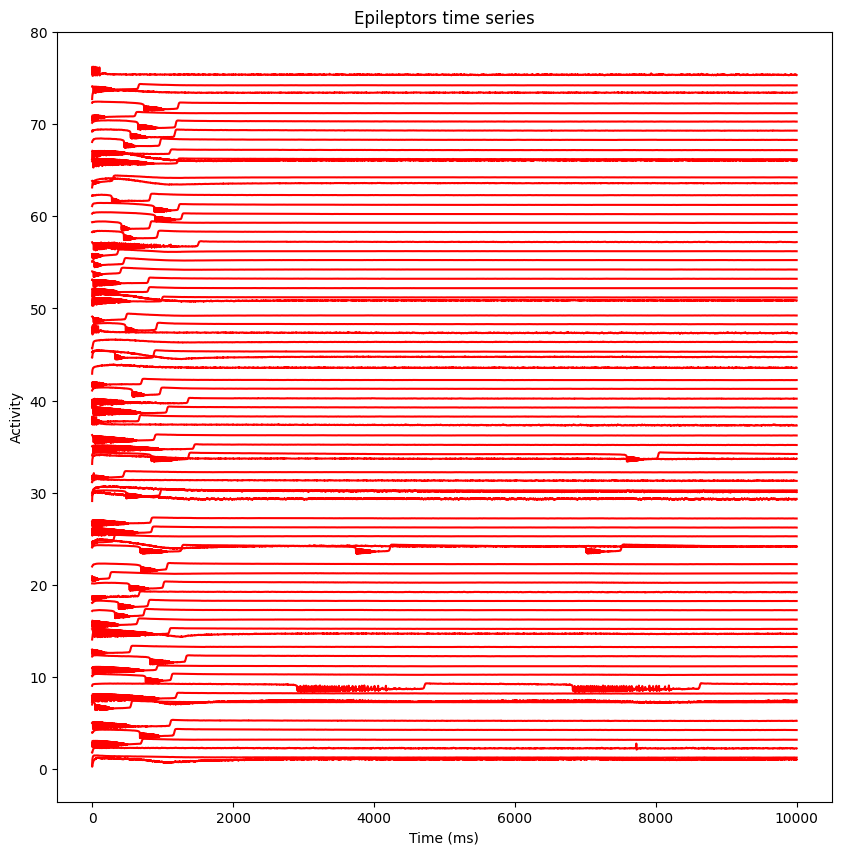

In [ ]:
plot_epileptor_time_series(t_tavg_deact8, tavg_deact8)

Display the EEG plot.

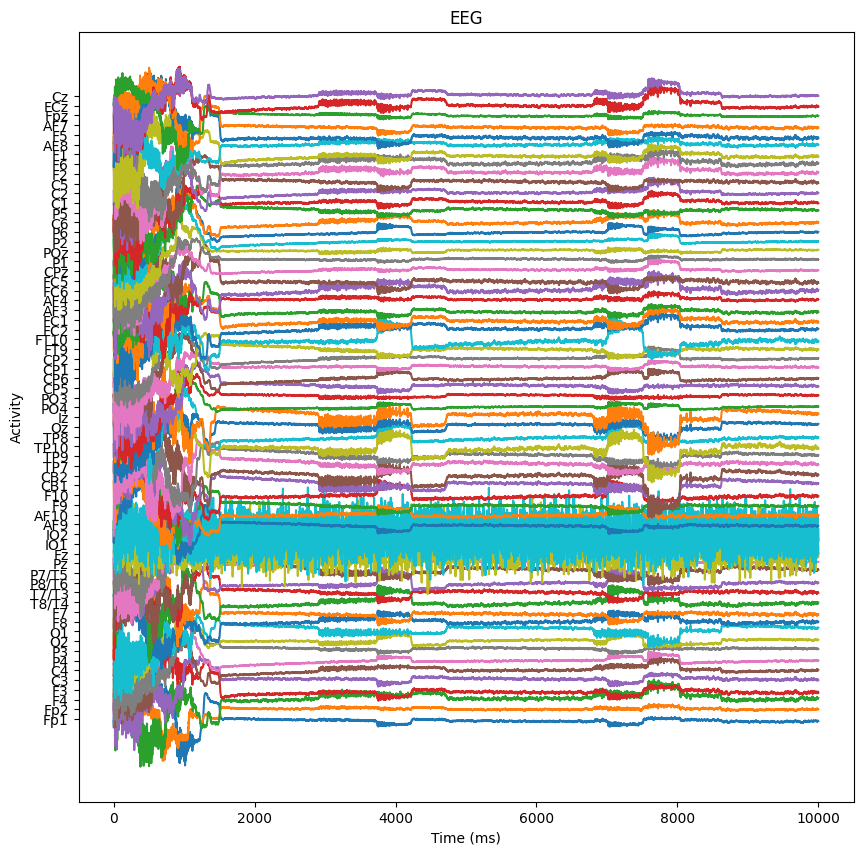

In [ ]:
plot_EEG(t_eeg_deact8, eeg_deact8, mon_EEG8)

### Deactivating the regions 2 and 34

In [ ]:
t_tavg_deact9, tavg_deact9, t_eeg_deact9, eeg_deact9, conn_deact9, mon_EEG9 = deact_BothZones(2, 9, 24, 34, 31)

2025-06-07 14:26:04,305 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:26:04,386 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 964c62eb-39e0-47c2-a801-d2a995e6091c
  coupling ......... Difference gid: 75e03e8b-4c49-4fbc-9ae5-7a1873b2fc60
  gid .............. UUID('2be29858-a060-4ba1-a5ea-726e04d720aa')
  initial_conditions  None
  integrator ....... HeunStochastic gid: ac63a378-231e-4146-b89b-10edcf18b2ee
  model ............ Epileptor gid: 4b214d2e-a031-40ca-ab80-f2b50f6c8134
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 2be29858-a060-4ba1-a5ea-726e04d720aa
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

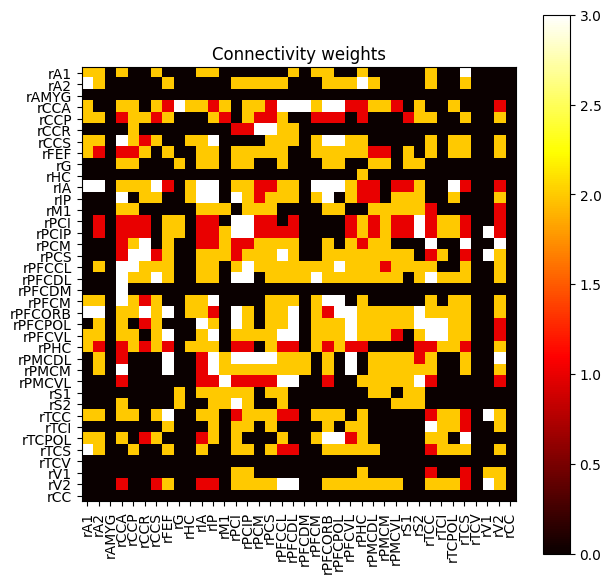

In [ ]:
plot_connectivity_weights(conn_deact9)

Display the right hemisphere before and after the deactivation of the areas 2 and 34 to see how it changes.

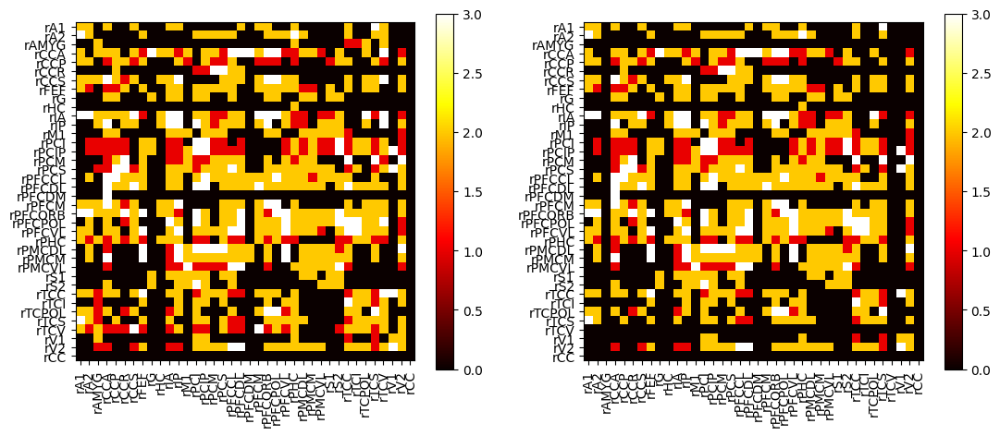

In [ ]:
plot_connectivity_compare(conn, conn_deact9)

Display the Epileptors time series plot.

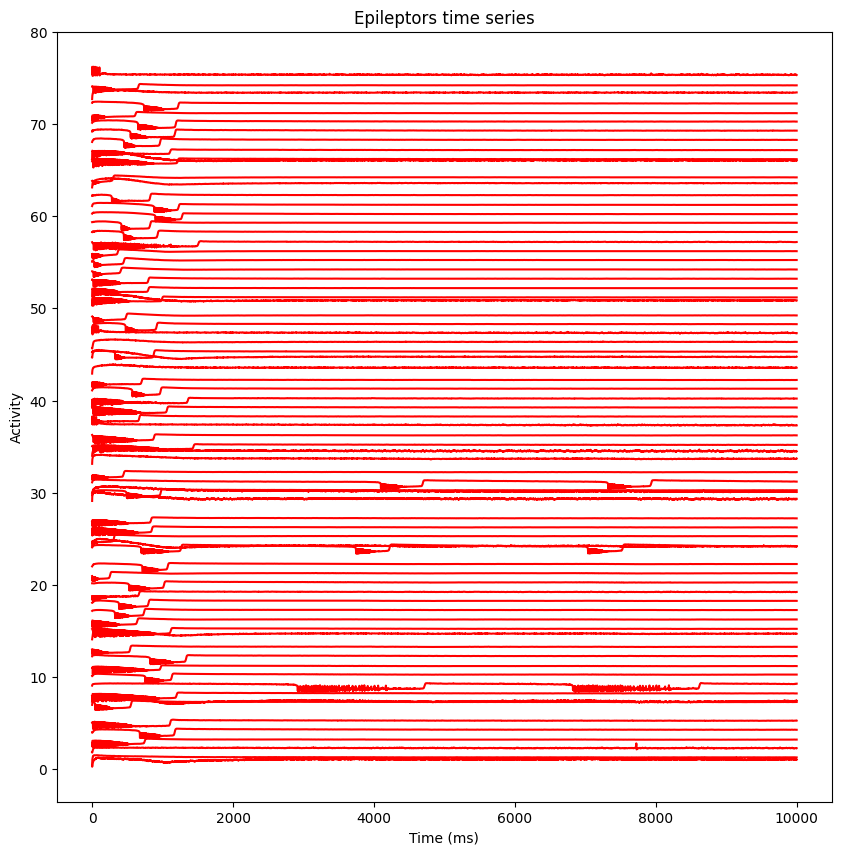

In [ ]:
plot_epileptor_time_series(t_tavg_deact9, tavg_deact9)

Display the EEG plot.

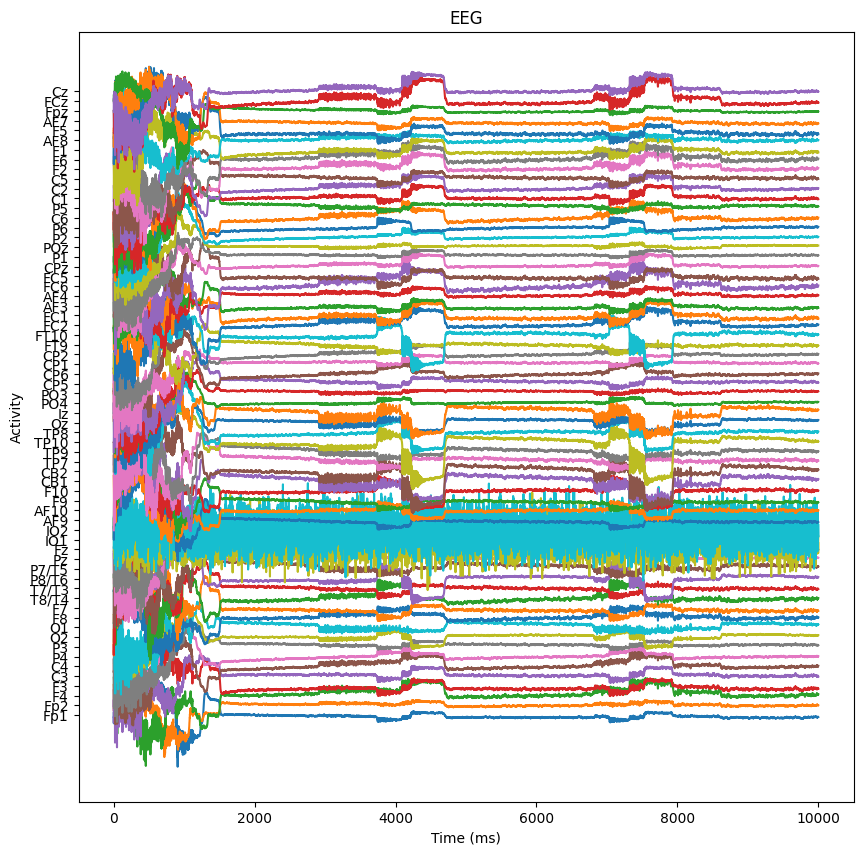

In [ ]:
plot_EEG(t_eeg_deact9, eeg_deact9, mon_EEG9)

### Deactivating the regions 9 and 31

In [ ]:
t_tavg_deact10, tavg_deact10, t_eeg_deact10, eeg_deact10, conn_deact10, mon_EEG10 = deact_BothZones(9, 2, 24, 31, 34)

2025-06-07 14:27:39,341 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:27:39,435 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: c373c116-f1ce-4055-9a7c-a19ae766c563
  coupling ......... Difference gid: bec72dbc-746c-47ea-b3b1-f14c8ed95e2f
  gid .............. UUID('aff14379-71ca-4213-a8ee-c15aa2665d69')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 27736bd2-f866-493b-a482-8d3b85dd6ae3
  model ............ Epileptor gid: 4c64f394-db95-44b5-a1b6-780718bb5862
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: aff14379-71ca-4213-a8ee-c15aa2665d69
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

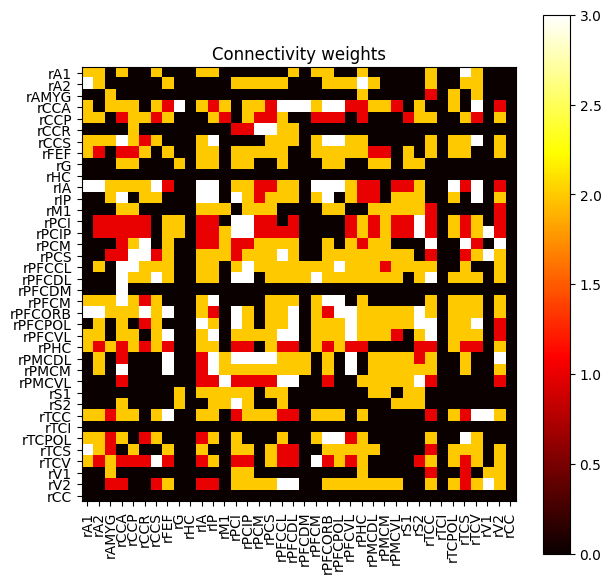

In [ ]:
plot_connectivity_weights(conn_deact10)

Display the right hemisphere before and after the deactivation of the areas 9 and 31 to see how it changes.

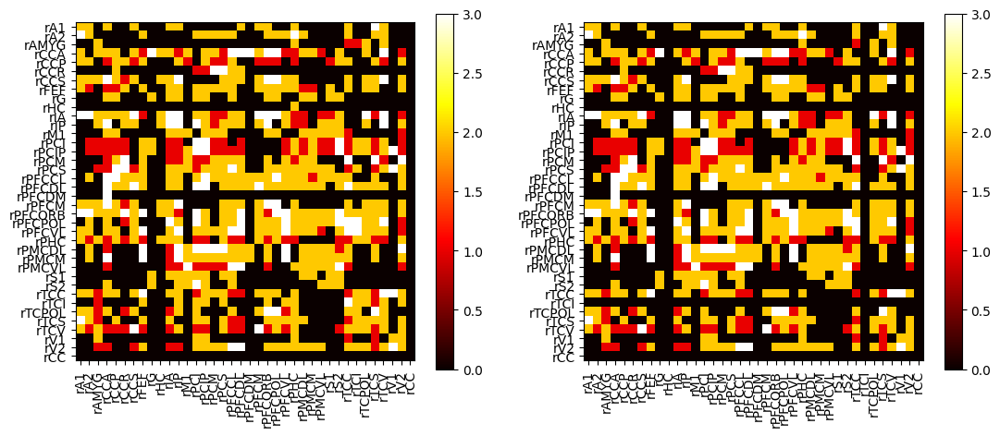

In [ ]:
plot_connectivity_compare(conn, conn_deact10)

Display the Epileptors time series plot.

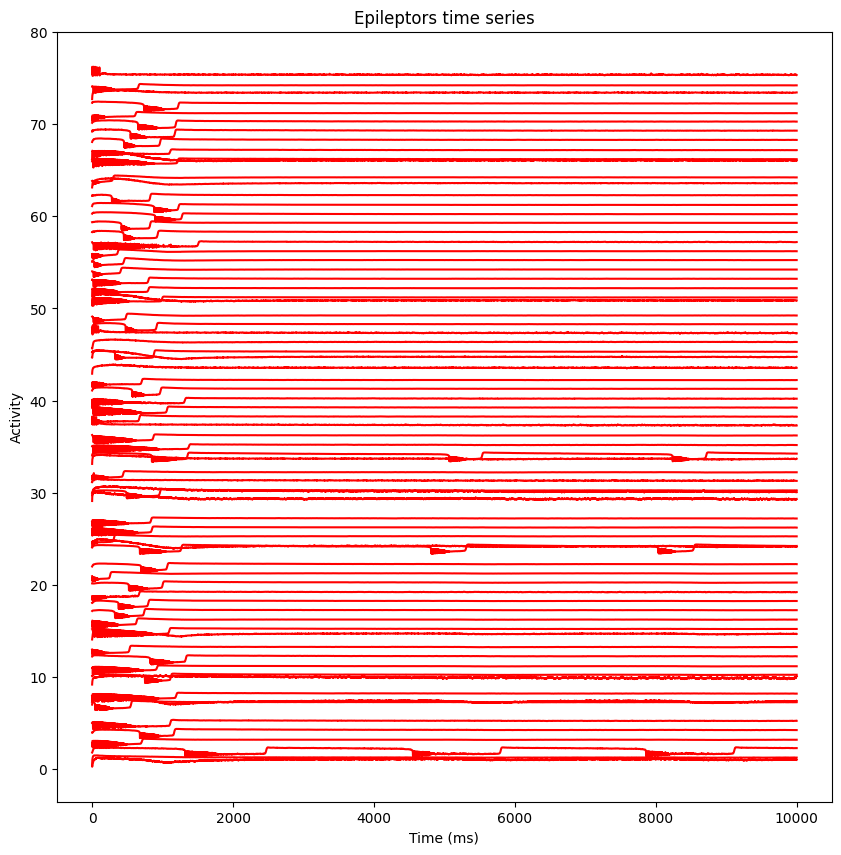

In [ ]:
plot_epileptor_time_series(t_tavg_deact10, tavg_deact10)

Display the EEG plot.

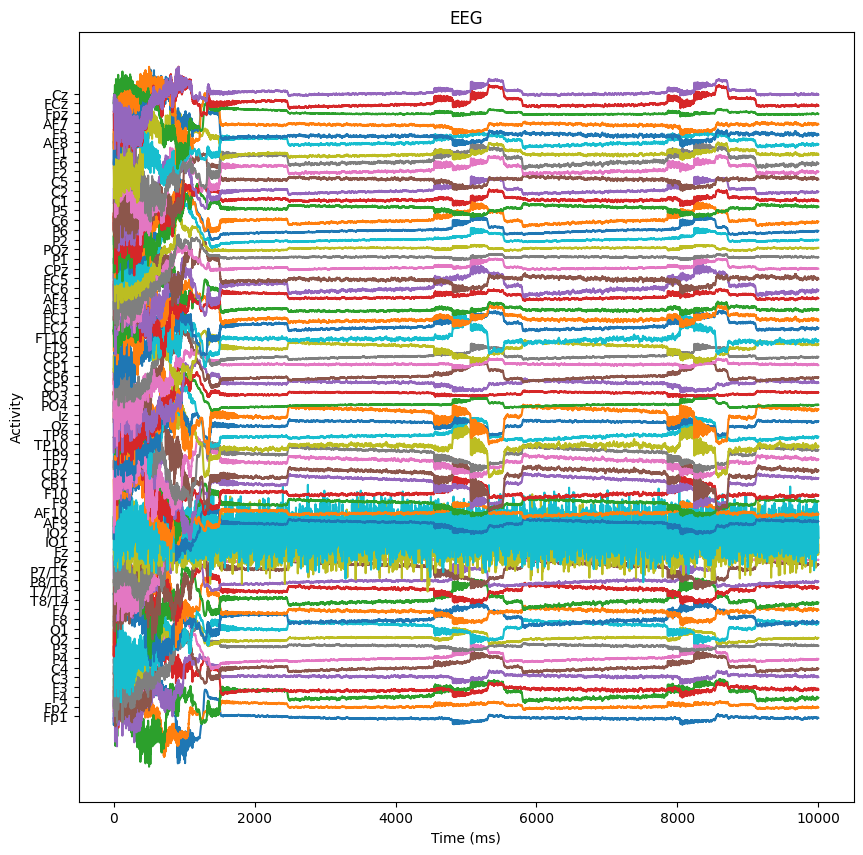

In [ ]:
plot_EEG(t_eeg_deact10, eeg_deact10, mon_EEG10)

### Deactivating the regions 9 and 34

In [ ]:
t_tavg_deact11, tavg_deact11, t_eeg_deact11, eeg_deact11, conn_deact11, mon_EEG11 = deact_BothZones(9, 2, 24, 34, 31)

2025-06-07 14:29:11,320 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:29:11,422 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 20e7943d-89cb-44b6-858c-53818b4eb6ea
  coupling ......... Difference gid: 4b4f97b4-3429-48a6-bef7-21bfbf93167f
  gid .............. UUID('8e344147-de8c-4fdf-a751-20f272d66bae')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 245979ae-f639-4e0c-b047-8bdbff461c18
  model ............ Epileptor gid: c70b93c8-317a-4452-bea6-eabd0e3d4124
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 8e344147-de8c-4fdf-a751-20f272d66bae
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

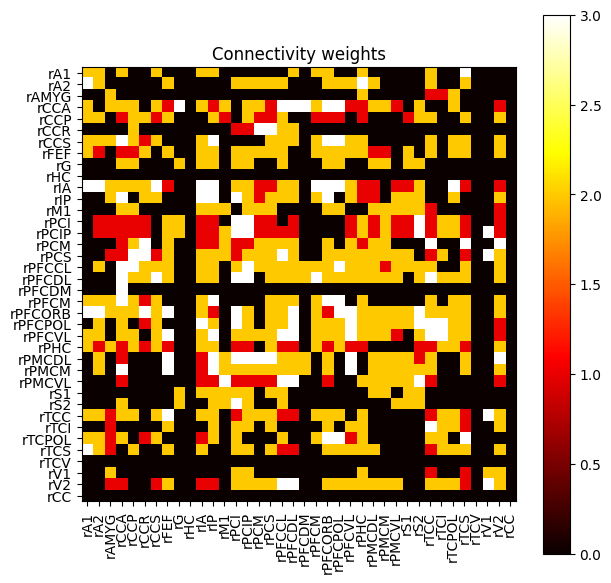

In [ ]:
plot_connectivity_weights(conn_deact11)

Display the right hemisphere before and after the deactivation of the areas 9 and 34 to see how it changes.

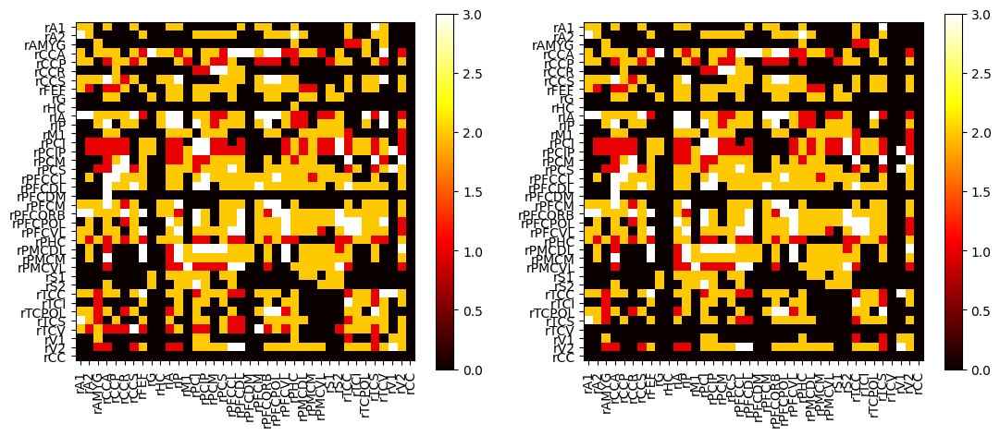

In [ ]:
plot_connectivity_compare(conn, conn_deact11)

Display the Epileptors time series plot.

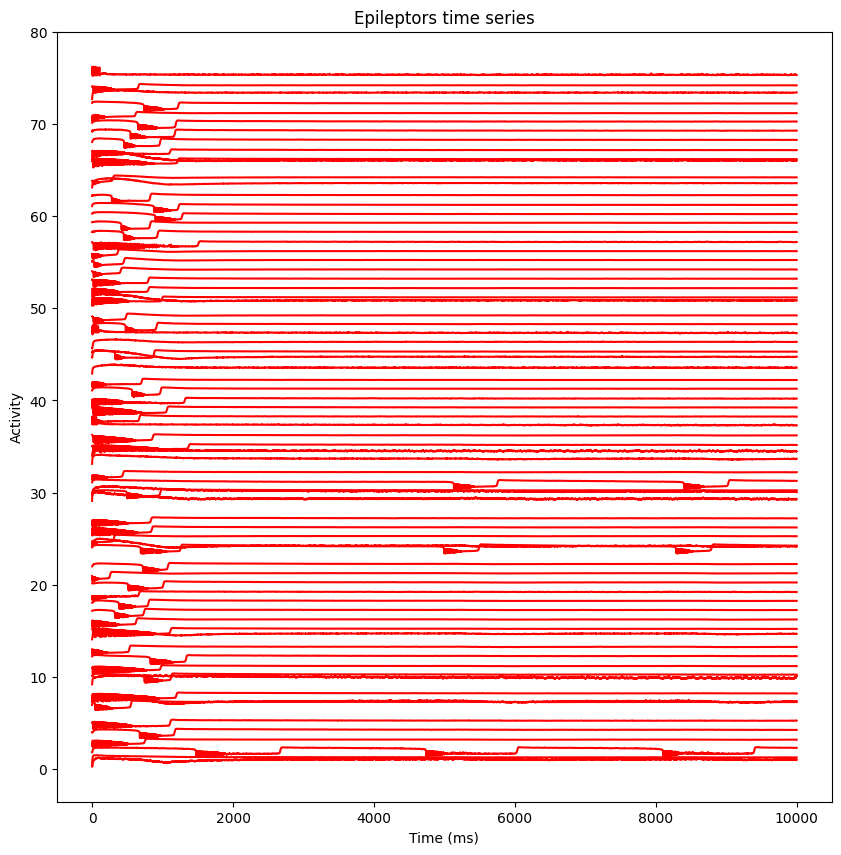

In [ ]:
plot_epileptor_time_series(t_tavg_deact11, tavg_deact11)

Display the EEG plot.

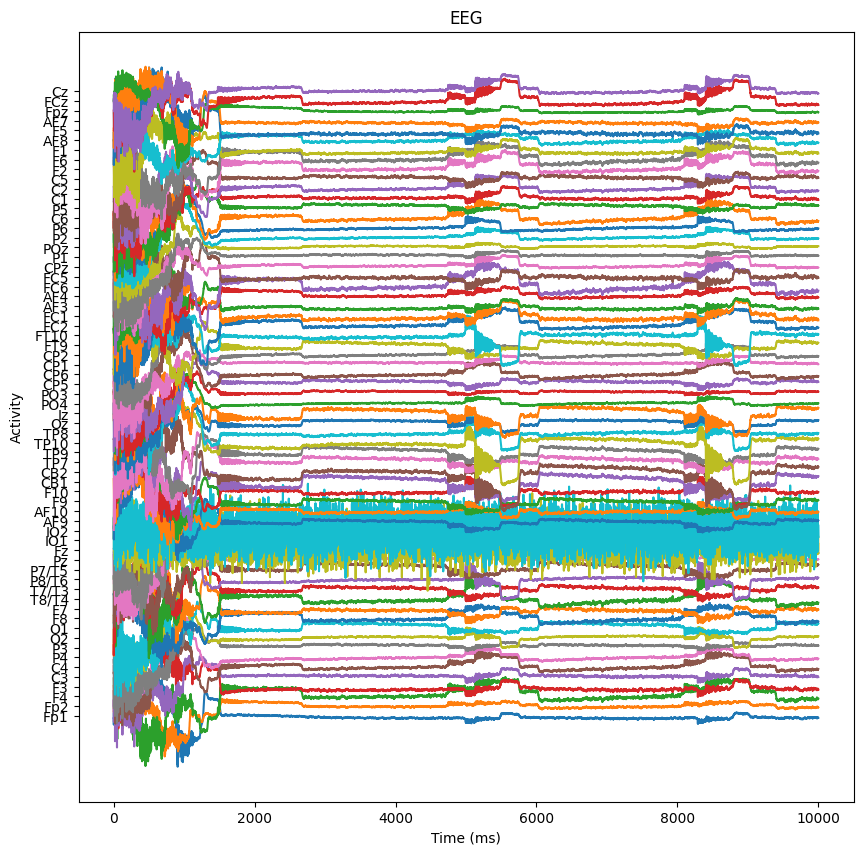

In [ ]:
plot_EEG(t_eeg_deact11, eeg_deact11, mon_EEG11)

### Deactivating the regions 24 and 31

In [ ]:
t_tavg_deact12, tavg_deact12, t_eeg_deact12, eeg_deact12, conn_deact12, mon_EEG12 = deact_BothZones(24, 9, 2, 31, 34)

2025-06-07 14:30:44,396 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:30:44,479 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 538282a4-0d6f-4c99-9e9e-6a40bf945647
  coupling ......... Difference gid: 94570124-e4ad-4fd8-8c86-35c60672df97
  gid .............. UUID('844786d0-ebf5-494e-8fde-54d108c8c3e5')
  initial_conditions  None
  integrator ....... HeunStochastic gid: aa1f83f3-1b69-45d9-ae42-fcc48cb6e367
  model ............ Epileptor gid: 9707ce44-0288-4bea-9b32-189e555efabc
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 844786d0-ebf5-494e-8fde-54d108c8c3e5
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

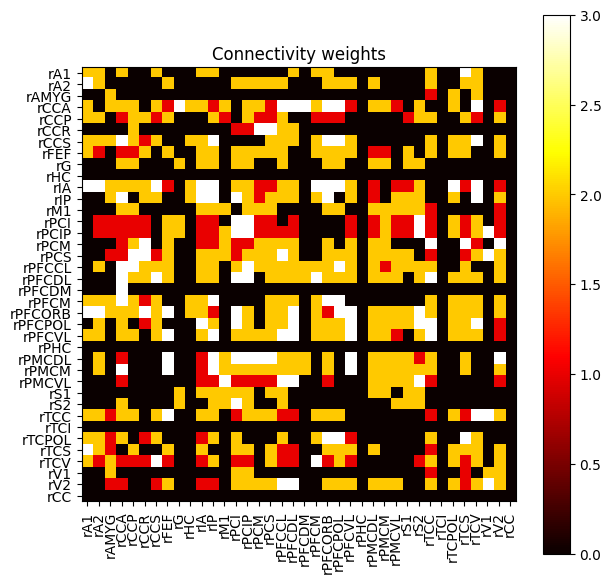

In [ ]:
plot_connectivity_weights(conn_deact12)

Display the right hemisphere before and after the deactivation of the areas 24 and 31 to see how it changes.

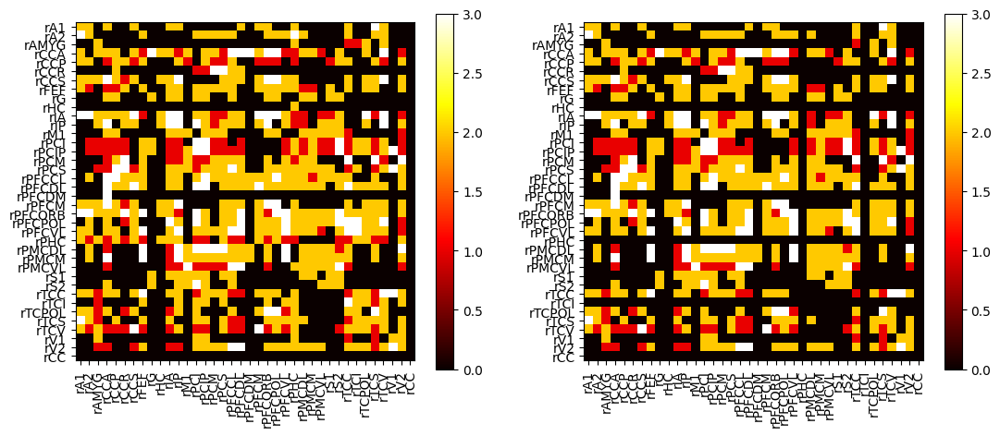

In [ ]:
plot_connectivity_compare(conn, conn_deact12)

Display the Epileptors time series plot.

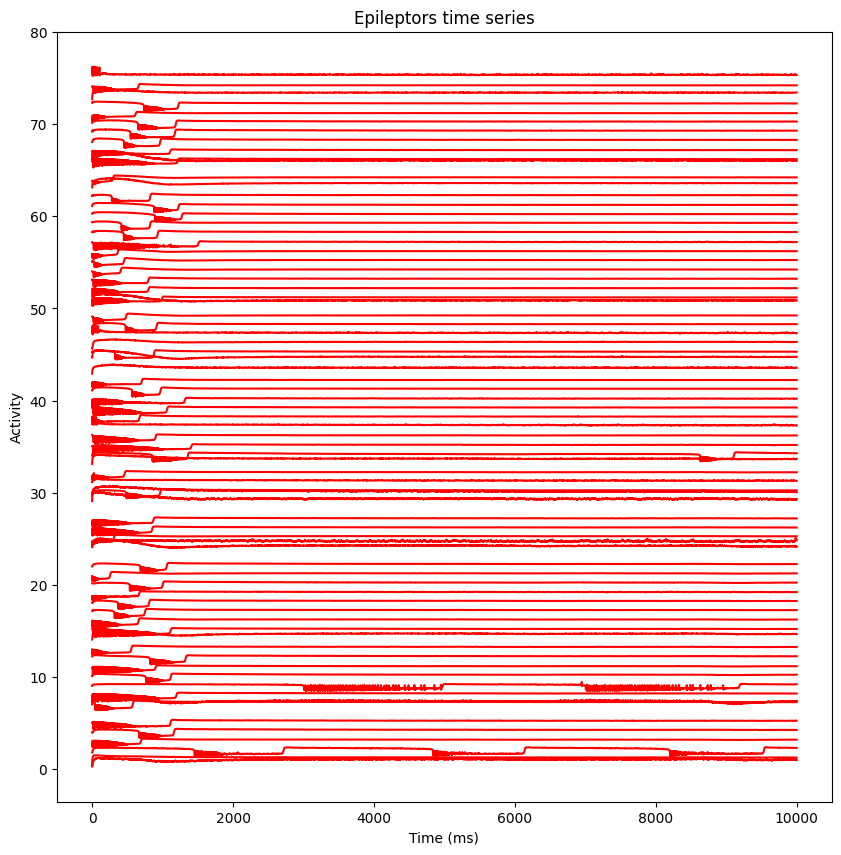

In [ ]:
plot_epileptor_time_series(t_tavg_deact12, tavg_deact12)

Display the EEG plot.

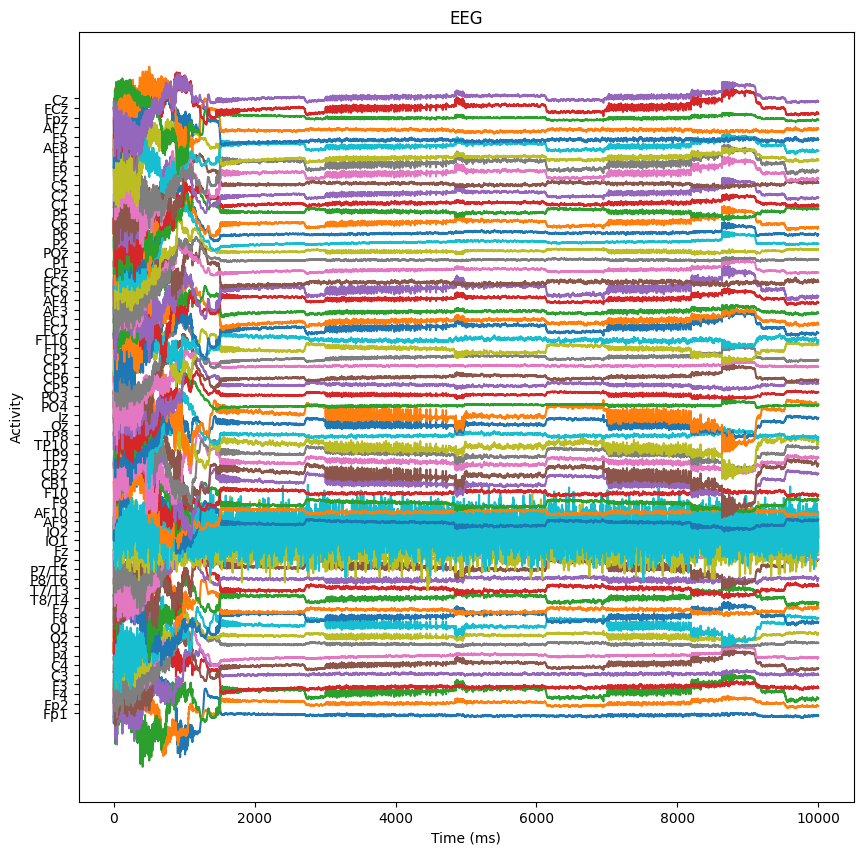

In [ ]:
plot_EEG(t_eeg_deact12, eeg_deact12, mon_EEG12)

### Deactivating the regions 24 and 34

In [ ]:
t_tavg_deact13, tavg_deact13, t_eeg_deact13, eeg_deact13, conn_deact13, mon_EEG13 = deact_BothZones(24, 9, 2, 34, 31)

2025-06-07 14:32:19,363 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.
2025-06-07 14:32:19,488 - INFO - tvb.simulator.monitors - Projection configured gain shape (65, 76)
Simulator (
  Type ............. Simulator
  conduction_speed . 3.0
  connectivity ..... Connectivity gid: 4a6add6e-5fe4-4f0d-b2ce-a024e72d7381
  coupling ......... Difference gid: 7ae47481-4324-4275-b77d-cf9afbb5e180
  gid .............. UUID('19db870f-8e58-49a9-8555-366052ceb7ae')
  initial_conditions  None
  integrator ....... HeunStochastic gid: 462b3d88-5f66-4c22-8821-c8c0f9eac4df
  model ............ Epileptor gid: 3d7b6c07-d756-4bf5-8189-7933a402d1ce
  monitors ......... ('TemporalAverage', 'EEG')
  simulation_length  1000.0
  stimulus ......... None
  surface .......... None
  title ............ Simulator gid: 19db870f-8e58-49a9-8555-366052ceb7ae
)


Display the brain's right hemisphere to visualize the regions that we set to 0, those are the black rows and columns.

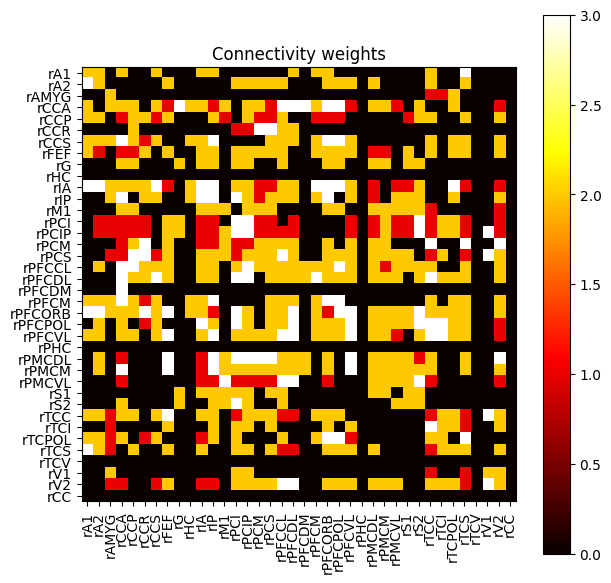

In [ ]:
plot_connectivity_weights(conn_deact13)

Display the right hemisphere before and after the deactivation of the areas 24 and 34 to see how it changes.

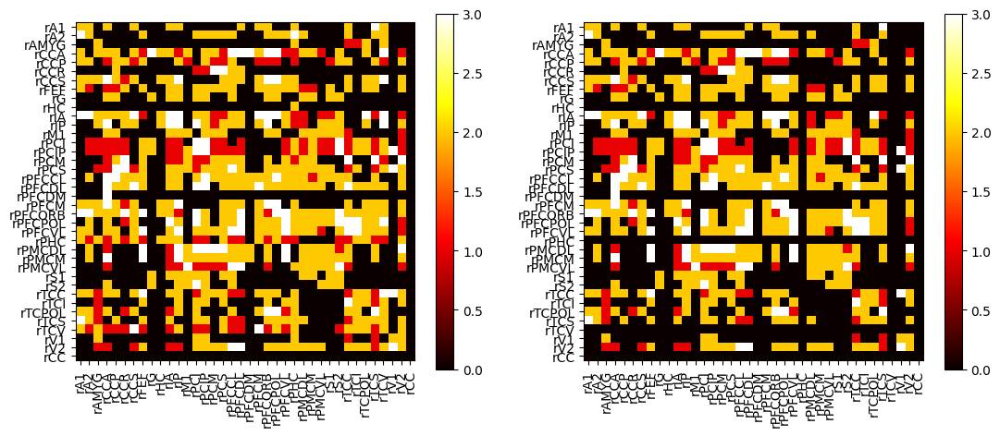

In [ ]:
plot_connectivity_compare(conn, conn_deact13)

Display the Epileptors time series plot.

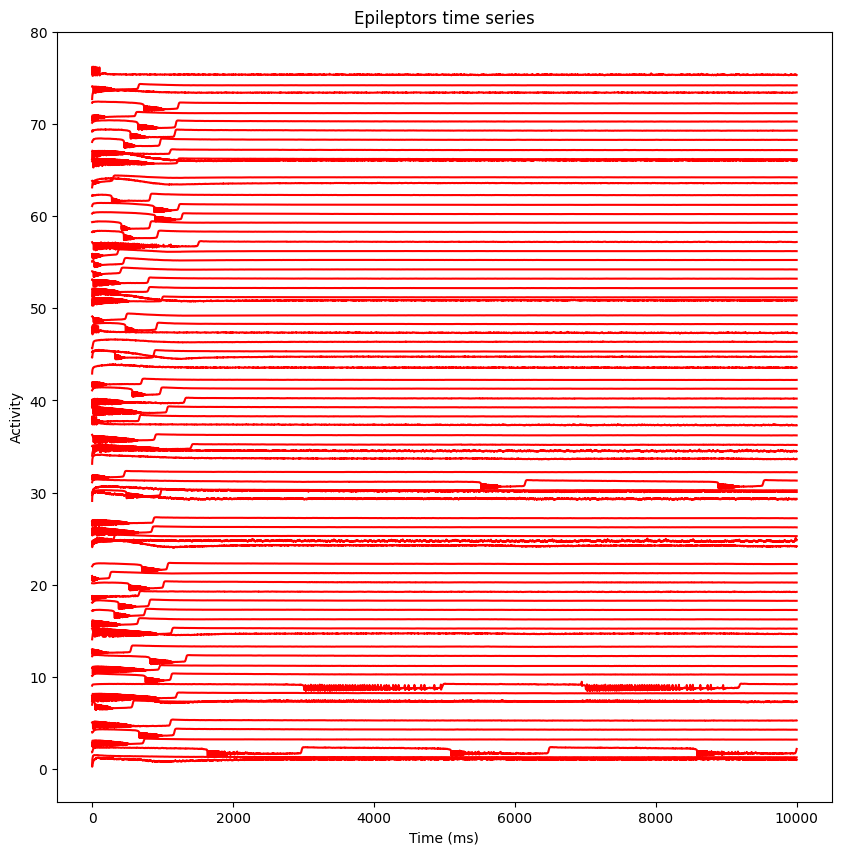

In [ ]:
plot_epileptor_time_series(t_tavg_deact13, tavg_deact13)

Display the EEG plot.

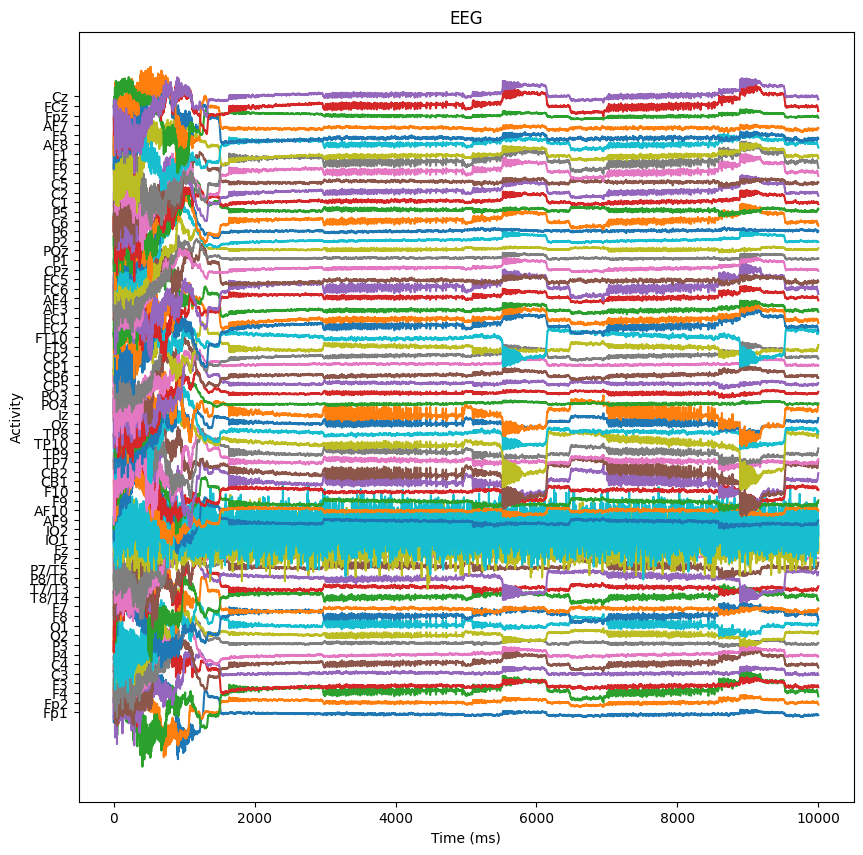

In [ ]:
plot_EEG(t_eeg_deact13, eeg_deact13, mon_EEG13)

# Analysis of the possible scenarios


## Finding the regions mostly connected to those that could be resected

After analyzing the result obtain from the deactivation of different combiantions of epileptogenic regions, we found the the best results were obtained by deactivating:
- Regions 9 (rHC), 2 (rAMYG) and 24 (rPHC)
- Regions 9 (rHC) and 2 (rAMYG)

We draw this conclusion observing the obtained Epileptors time series plot and EEG plot. We looked for the graphs with less variability, which indicates the presence of seizures.

Given that the brain wiring is carefully balanced and interconnected, the regions mostly connected to those that could be resected have to be identified to better understand the risks of the surgery.

The regions are found by checking the connectivity of the regions rHC, rAMYG and rPHC from the connectivity matrix of the epileptic brain simulation.

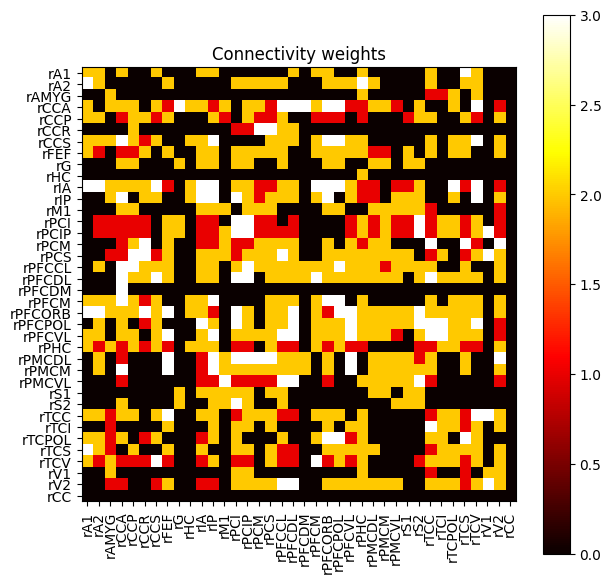

In [ ]:
plot_connectivity_weights(conn)

The regions connected to the region rHC (9)

In [ ]:
# For the connectivity of the region rHC (9)
count = 0
for i, row in enumerate(conn.weights[:38, :38]):
  for j, w in enumerate(row):
    if w > 0:
      if labels[i] == "rHC":
        print(f"The region {labels[j]} is connected to rHC with weight {w}")
        count += 1
      elif labels[j] == "rHC":
        print(f"The region {labels[i]} is connected to rHC with weight {w}")
        count += 1

print("-"*100)
print(f"There are {count} regions connected to rHC")

The region rCCA is connected to rHC with weight 2.0
The region rCCS is connected to rHC with weight 2.0
The region rPHC is connected to rHC with weight 2.0
The region rIA is connected to rHC with weight 2.0
The region rIP is connected to rHC with weight 2.0
The region rPFCM is connected to rHC with weight 2.0
The region rPFCORB is connected to rHC with weight 2.0
The region rPHC is connected to rHC with weight 2.0
----------------------------------------------------------------------------------------------------
There are 8 regions connected to rHC


The regions connected to the region rAMYG (2)

In [ ]:
# For the connectivity of the region rAMYG (2)
count = 0
for i, row in enumerate(conn.weights[:38, :38]):
  for j, w in enumerate(row):
    if w > 0:
      if labels[i] == "rAMYG":
        print(f"The region {labels[j]} is connected to rAMYG with weight {w}")
        count += 1
      elif labels[j] == "rAMYG":
        print(f"The region {labels[i]} is connected to rAMYG with weight {w}")
        count += 1

print("-"*100)
print(f"There are {count} regions connected to rAMYG")

The region rAMYG is connected to rAMYG with weight 2.0
The region rPHC is connected to rAMYG with weight 2.0
The region rTCC is connected to rAMYG with weight 1.0
The region rTCI is connected to rAMYG with weight 1.0
The region rTCPOL is connected to rAMYG with weight 2.0
The region rTCV is connected to rAMYG with weight 2.0
The region rCCA is connected to rAMYG with weight 2.0
The region rCCS is connected to rAMYG with weight 2.0
The region rIA is connected to rAMYG with weight 2.0
The region rIP is connected to rAMYG with weight 2.0
The region rPCI is connected to rAMYG with weight 1.0
The region rPCIP is connected to rAMYG with weight 1.0
The region rPCS is connected to rAMYG with weight 1.0
The region rPFCM is connected to rAMYG with weight 2.0
The region rPFCORB is connected to rAMYG with weight 2.0
The region rPHC is connected to rAMYG with weight 2.0
The region rTCC is connected to rAMYG with weight 1.0
The region rTCI is connected to rAMYG with weight 1.0
The region rTCPOL is c

The regions connected to the region rPHC (24)

In [ ]:
# For the connectivity of the region rPHC (24)
count = 0
for i, row in enumerate(conn.weights[:38, :38]):
  for j, w in enumerate(row):
    if w > 0:
      if labels[i] == "rPHC":
        print(f"The region {labels[j]} is connected to rPHC with weight {w}")
        count += 1
      elif labels[j] == "rPHC":
        print(f"The region {labels[i]} is connected to rPHC with weight {w}")
        count += 1

print("-"*100)
print(f"There are {count} regions connected to rPHC")

The region rA1 is connected to rPHC with weight 2.0
The region rA2 is connected to rPHC with weight 3.0
The region rAMYG is connected to rPHC with weight 2.0
The region rCCA is connected to rPHC with weight 1.0
The region rCCP is connected to rPHC with weight 1.0
The region rCCS is connected to rPHC with weight 2.0
The region rFEF is connected to rPHC with weight 2.0
The region rHC is connected to rPHC with weight 2.0
The region rIA is connected to rPHC with weight 1.0
The region rIP is connected to rPHC with weight 1.0
The region rPCI is connected to rPHC with weight 2.0
The region rPCIP is connected to rPHC with weight 2.0
The region rPCM is connected to rPHC with weight 1.0
The region rPCS is connected to rPHC with weight 2.0
The region rPFCCL is connected to rPHC with weight 2.0
The region rPFCDL is connected to rPHC with weight 2.0
The region rPFCM is connected to rPHC with weight 2.0
The region rPFCORB is connected to rPHC with weight 2.0
The region rPFCPOL is connected to rPHC w

From the connectivity evaluation, it is discovered that:
- rHC (9) has 8 regions connected to it
- rAMYG (2) has 23 regions connected to it
- rPHC (24) has 56 regions connected to it

Given that the total number of brain regions considered is 76, most likely the region rPHC is better if not removed.


## Choose areas to be resected

We perform a quantitative comparison of the two chosen combinations, which are considered the best, to assess which is the best one to be resected.

For the quantitative approach we consider the **mean brain activity over time**.

Each region of the brain produces a time series of activity (that can be seen in the Epileptors time series graph), so we want to calculate the mean of this activity across all brain regions at every time point.

The mean brain activity over time allows us to understand how the whole brain behaves in time:
- High value: stable behavior
- Low value: pathological behavior

Low values of the mean brain activity are associated with pathological behaviors because the epileptic zones are defined as areas with lower values.

In [ ]:
mean_base = tavg[:, 0, :, 0].mean(axis=1)            # Baseline
mean_deact0 = tavg_deact0[:, 0, :, 0].mean(axis=1)   # Deactivate 9, 2 and 24
mean_deact1 = tavg_deact1[:, 0, :, 0].mean(axis=1)   # Deactivate 9 and 2

Calculate the mean brain activity over time.

In [ ]:
print(f"Baseline: {np.mean(mean_base[-200:]):.4f}")
print(f"Deactivated 9, 2 and 24: {np.mean(mean_deact0[-200:]):.4f}")
print(f"Deactivated 9 and 2: {np.mean(mean_deact1[-200:]):.4f}")

Baseline: 0.3587
Deactivated 9, 2 and 24: 0.3750
Deactivated 9 and 2: 0.3687


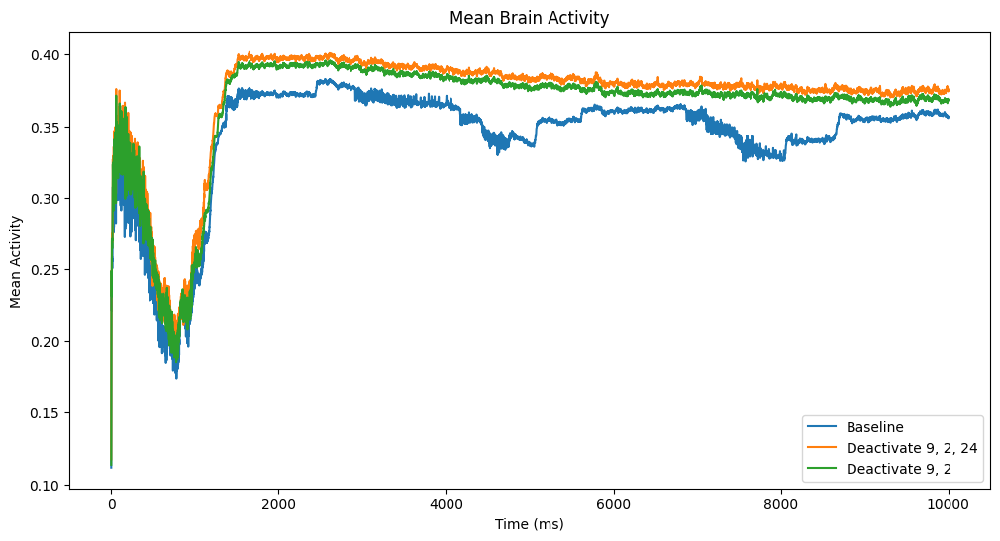

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(t_tavg, mean_base, label="Baseline")
plt.plot(t_tavg_deact0, mean_deact0, label="Deactivate 9, 2, 24")
plt.plot(t_tavg_deact1, mean_deact1, label="Deactivate 9, 2")
plt.title("Mean Brain Activity")
plt.xlabel("Time (ms)")
plt.ylabel("Mean Activity")
plt.legend()
plt.show()

We can observe that the mean brain activity over time is higher when deactivating the epileptogenic zones in the areas 9, 2 and 24. This means that surgically removing these zones of the brain will guarantee the best results, this means that the patients will probably experience less epileptic seizures or, hopefully, they will stop completely.

# Conclusion

In this project The Virtual Brain was used to simulate an epilepsy patient's brain. We used an Epileptor model to assign different levels of epileptogenicity to brain regions rHC (9), rPHC (24), rAMYG (2), rTCI (31) and rTCV (34). By running multiple simulations we observed that deactivating the epileptogenic zone reduces epileptic events.

As expected, the best result was obtained by deactivating areas 2, 9 and 24, which are the brain regions that we set as most epipleptogenic in the model. However, we observed that the ares rPCH (24) is highly connected to 56 brain regions so it might be more appropriate to surgically resect only areas 2 and 9 to ensure a better overall brain connectivity. Furthermore, the result obtained by the deactivation of areas 9 and 2 differs only slightly from the one obtained by removing all the three areas.

We can conclude that The Virtual Brain could be a powerful tool in the analyzed framework and it could support personalized clinical decion-making for epileptic patients whose seizures are drug resistant.

